In [1]:
# Data Analysis & Manipulation
import numpy as np
import pandas as pd

#Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Outlier Treatment, Peprocessor, Scaler
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, StandardScaler, PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

#Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Regressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso,Ridge, LinearRegression, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor

#Evaluation & Metrics
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

#Saving Model
import joblib

# Prevent WARNINGS!
import warnings
warnings.filterwarnings('ignore')


In [2]:
# Loading Dataset
df = pd.read_csv(r"D:\Studies\DataScience\DataTrained\DataTrained_Classes\FlipRobo\FlipRobo2\ProjectEvaluation\Phase3\weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [5]:
# Checking the dimension of data
print('We have {} rows and {} columns in our dataframe'.format(*df.shape))
print('\n')
# Checking the column names in our dataframe
print('Columns in our dataframe are:\n', df.columns)

We have 8425 rows and 23 columns in our dataframe


Columns in our dataframe are:
 Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')


In [6]:
# Checking data datatypes
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [7]:
# Understanding data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [8]:
# Duplicate Values in our Dataframe
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  1663


In [9]:
#Dropping Duplocate values
df.drop_duplicates(keep='last', inplace=True)

In [10]:
# After dropping Duplicate Values checking again
print("Total Duplicate Values in our Dataframe are: ", df.duplicated().sum())

Total Duplicate Values in our Dataframe are:  0


In [11]:
#Checking the dimension of our dataframe
df.shape

(6762, 23)

In [12]:
#Checking Missing Values
print("Total Missing Values in our Dataframe are: ", df.isnull().sum().sum())
print('\n')

# Checking for Missing values
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

Total Missing Values in our Dataframe are:  16513


               Missing Values  % Missing data
Sunshine                 3236       47.855664
Evaporation              2921       43.197279
Cloud3pm                 1902       28.127773
Cloud9am                 1866       27.595386
Pressure3pm              1311       19.387755
Pressure9am              1308       19.343390
WindGustDir               942       13.930790
WindGustSpeed             942       13.930790
WindDir9am                794       11.742088
WindDir3pm                294        4.347826
Rainfall                  138        2.040816
RainToday                 138        2.040816
RainTomorrow              138        2.040816
WindSpeed3pm              100        1.478852
Humidity3pm                96        1.419698
Temp3pm                    92        1.360544
MinTemp                    70        1.035197
WindSpeed9am               63        0.931677
MaxTemp                    57        0.842946
Humidity9am                5

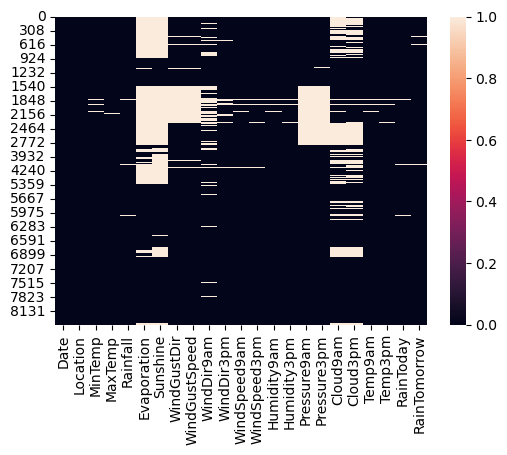

In [13]:
#Visualizing it
plt.figure(figsize=(6,4))
sns.heatmap(df.isnull())
plt.show()

In [14]:
# Separating Numerical & Categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['float64']).columns

print('Categorical columns are: ',categorical_columns)
print('\n')
print('Numerical_columns are: ',numerical_columns)

Categorical columns are:  Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


Numerical_columns are:  Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


In [15]:
# Checking missing values in Categorical columns
df[categorical_columns].isnull().sum()

Date              0
Location          0
WindGustDir     942
WindDir9am      794
WindDir3pm      294
RainToday       138
RainTomorrow    138
dtype: int64

In [16]:
# Checking missing values in Numerical columns
df[numerical_columns].isnull().sum()

MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustSpeed     942
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
dtype: int64

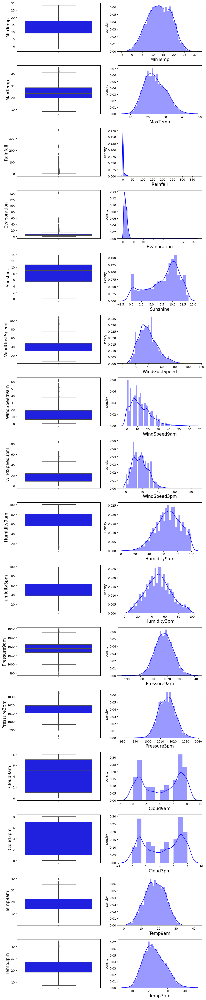

In [17]:
# Visualizing Numerical columns befor missing value imputation
plt.figure(figsize=(10, 3 * len(numerical_columns)))

# Loop through each numerical column and create plots
for i, column in enumerate(numerical_columns):
    plt.subplot(len(numerical_columns), 2, 2 * i + 1)
    sns.boxplot(y=column, data=df, color='blue')
    plt.ylabel(column, fontsize=15)
    
    plt.subplot(len(numerical_columns), 2, 2 * i + 2)
    sns.distplot(df[column], color='blue')
    plt.xlabel(column, fontsize=15)

plt.tight_layout()
plt.show()

In [18]:
# Imputation techniques
impute_techniques = {
    'MinTemp': 'mean',
    'MaxTemp': 'median',
    'Rainfall': 'median',
    'Evaporation': 'median',
    'Sunshine': 'mean',
    'WindGustSpeed': 'median',
    'WindSpeed9am': 'median',
    'WindSpeed3pm':'median',
    'Humidity9am': 'median',
    'Humidity3pm': 'mean',
    'Pressure9am': 'median',
    'Pressure3pm': 'median',
    'Cloud9am': 'mean',
    'Cloud3pm': 'mean',
    'Temp9am': 'median',
    'Temp3pm': 'median',
    'WindGustDir' : 'mode',
    'WindDir9am' : 'mode',
    'WindDir3pm' : 'mode',
    'RainToday' : 'mode',
    'RainTomorrow' : 'mode'   
}

# Impute based on defined techniques
for column, technique in impute_techniques.items():
    if technique == 'mode':
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)
    elif technique == 'mean':
        mean_value = df[column].mean()
        df[column].fillna(mean_value, inplace=True)
    elif technique == 'median':
        median_value = df[column].median()
        df[column].fillna(median_value, inplace=True)

df.sample(5)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
7541,2012-08-28,PerthAirport,10.5,19.1,10.2,2.6,7.000000,WSW,56.0,WNW,...,87.0,52.0,1016.8,1016.7,7.000000,5.000000,14.9,18.2,Yes,Yes
4240,2017-05-08,Williamtown,8.4,19.8,0.0,4.6,7.890896,S,31.0,WSW,...,60.0,55.0,1026.8,1024.1,6.000000,5.000000,14.8,19.4,No,No
6588,2012-05-03,Brisbane,16.1,25.0,0.0,4.6,7.700000,ENE,22.0,SW,...,74.0,70.0,1019.5,1015.8,3.000000,6.000000,20.8,23.5,No,Yes
5477,2010-02-28,Melbourne,16.3,20.7,0.0,4.0,5.200000,S,52.0,SSW,...,60.0,43.0,1021.8,1022.1,7.000000,6.000000,17.3,19.8,No,No
6764,2014-07-14,Adelaide,6.1,11.9,0.0,3.4,7.890896,ENE,33.0,NE,...,59.0,47.0,1029.5,1023.3,4.336806,4.320988,8.9,11.6,No,Yes


In [19]:
# Checking missing values are imputation
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [20]:
# Statistical Summary
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.109145,24.093301,2.723410,4.99898,7.890896,38.702159,12.765602,17.562703,67.510500,50.467147,1017.621222,1015.116060,4.336806,4.320988,17.895830,22.700281
std,5.540667,6.130367,10.490138,3.36177,2.733639,13.393977,9.789075,9.548883,17.182756,18.498341,6.027923,5.967643,2.474649,2.323276,5.722418,5.972262
min,-2.000000,8.200000,0.000000,0.00000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.00000,7.890896,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.109145,23.500000,0.000000,4.60000,7.890896,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,4.336806,4.320988,18.000000,22.100000
75%,17.400000,28.400000,0.800000,5.00000,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.00000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [21]:
# Calculate value counts for our target
value_counts = df.RainTomorrow.value_counts()

# Calculate percentages
percentages = (value_counts / len(df)) * 100

# Combine value counts and percentages into a DataFrame
Rainfall = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})

# Print the result DataFrame
print(Rainfall)

     Count  Percentage
No    5190    76.75244
Yes   1572    23.24756


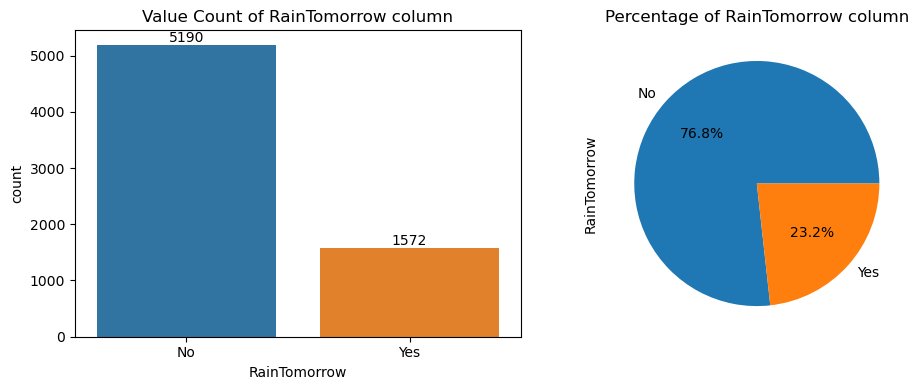

In [22]:
# Visualizing it:
fig, axes = plt.subplots(1,2,figsize=(10,4))

# First plot: Value count of the column using count plot
ax = sns.countplot(x='RainTomorrow', data=df, ax=axes[0])
for container in ax.containers:
    ax.bar_label(container)
axes[0].set_title('Value Count of RainTomorrow column')

# Second plot: Percentage of RainTomorrow column
df['RainTomorrow'].value_counts().plot(kind="pie", autopct="%0.1f%%", ax=axes[1])
axes[1].set_title('Percentage of RainTomorrow column')

plt.tight_layout()
plt.show()

In [23]:
df.Rainfall.value_counts()

0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [24]:
# finding details about minimum and maximum Rainfall amount
print('Minimum Capacity of Rainfall amount:',df.Rainfall.min())
print('Maximum Capacity of Rainfall amount:',df.Rainfall.max())

Minimum Capacity of Rainfall amount: 0.0
Maximum Capacity of Rainfall amount: 371.0


In [25]:
# checking Smallest & Biggest Powerplant in our dataframe
df.loc[(df['Rainfall'] == 371.0)]


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
1149,2009-11-07,CoffsHarbour,17.4,23.1,371.0,4.6,3.5,E,37.0,SW,...,93.0,81.0,1026.6,1025.9,8.0,5.0,18.6,22.0,Yes,Yes


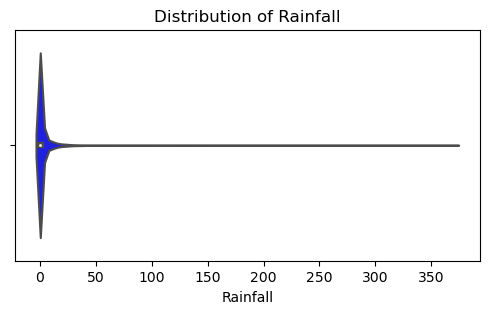

In [26]:
# Visualizing It
plt.figure(figsize=(6,3))
sns.violinplot(x='Rainfall', data=df, color='blue')
plt.title('Distribution of Rainfall')
plt.show()

In [27]:
df.loc[df.Rainfall >25].shape

(160, 23)

In [28]:
for i in categorical_columns[:-1]:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: Date
            Values  Percentage
2011-02-11       4    0.059154
2011-02-18       4    0.059154
2011-03-18       4    0.059154
2011-03-19       4    0.059154
2011-03-20       4    0.059154
...            ...         ...
2016-11-03       1    0.014789
2016-11-02       1    0.014789
2016-11-01       1    0.014789
2016-10-31       1    0.014789
2013-06-08       1    0.014789

[3004 rows x 2 columns]
Column Name: Location
              Values  Percentage
PerthAirport    1204   17.805383
Albury           907   13.413191
Newcastle        822   12.156167
Melbourne        811   11.993493
Williamtown      615    9.094942
CoffsHarbour     611    9.035788
Brisbane         579    8.562555
Penrith          482    7.128069
Darwin           250    3.697131
Wollongong       237    3.504880
Adelaide         205    3.031647
Uluru             39    0.576752
Column Name: WindGustDir
     Values  Percentage
E      1460   21.591245
SW      465    6.876664
N       459    6.787933
W       434  

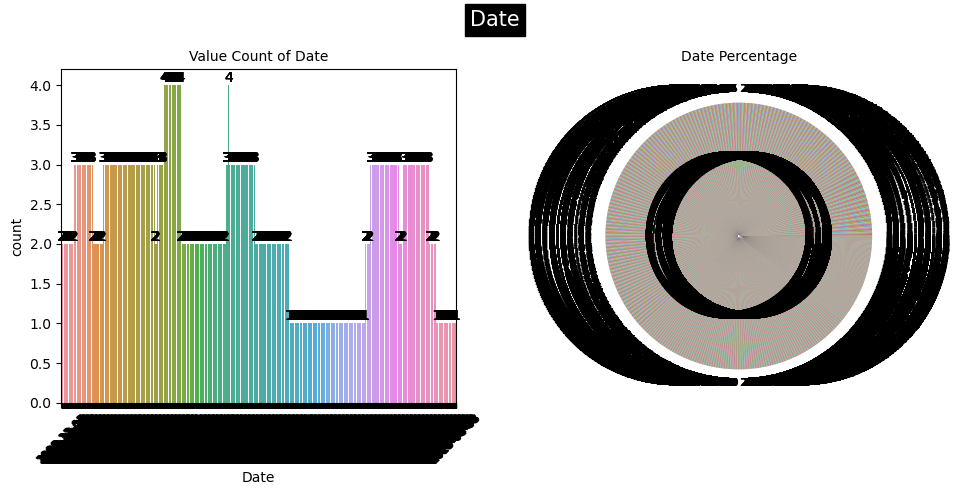

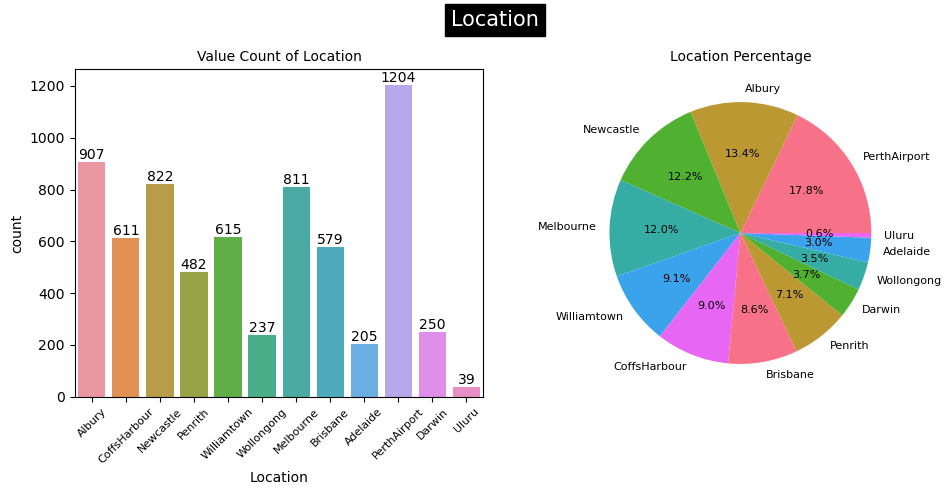

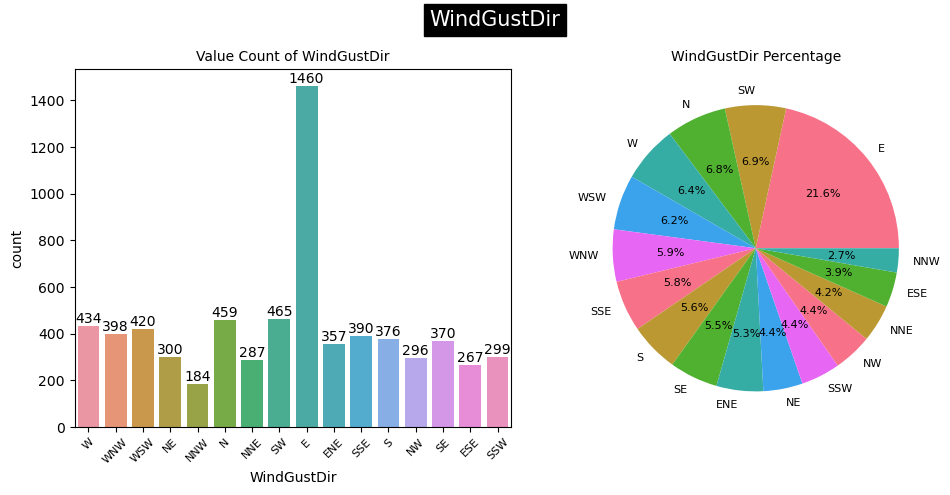

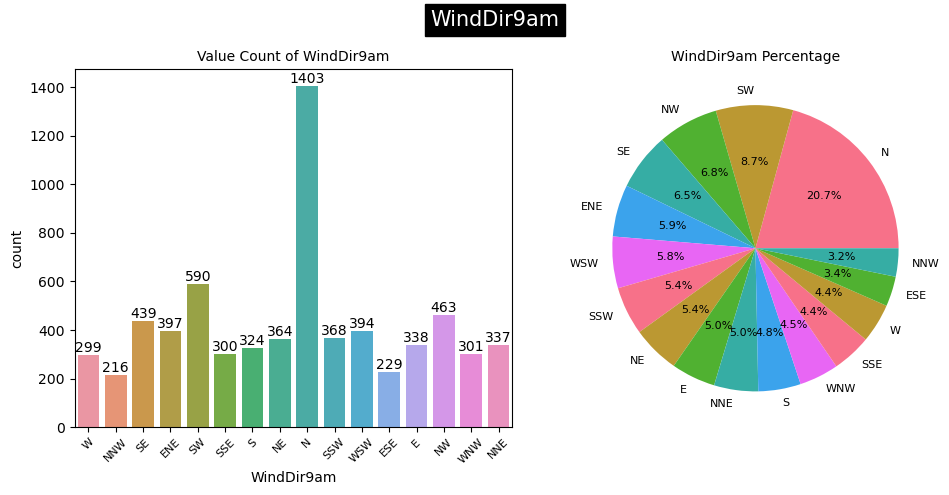

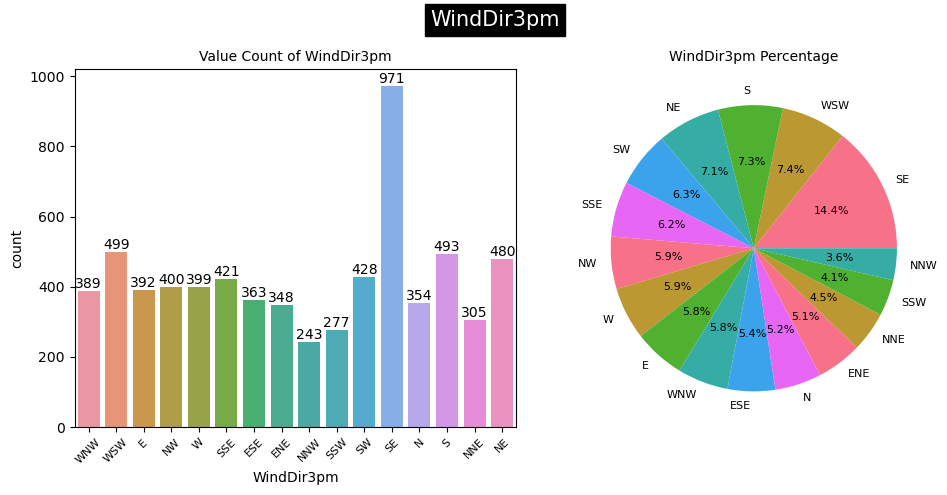

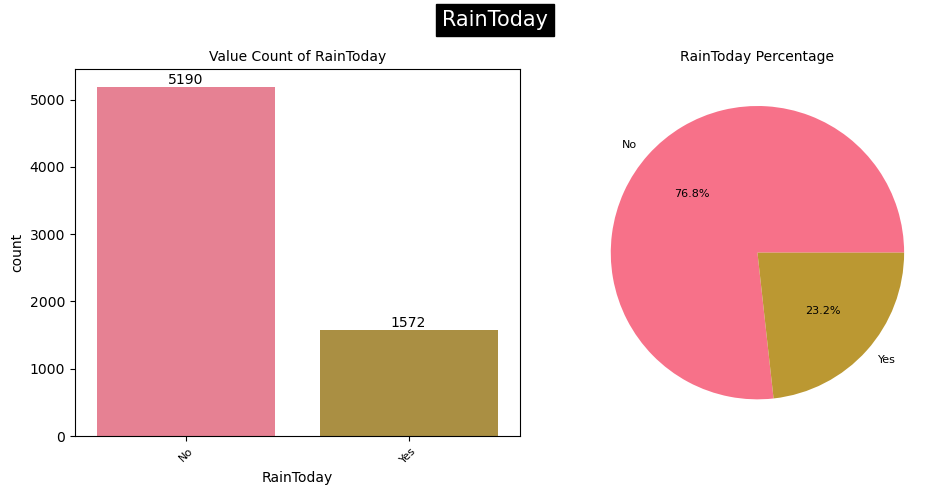

In [29]:
#Visualizing it
cat_col = categorical_columns[:-1]

#Iterate over Categorical column
for i, column in enumerate(cat_col):
    
    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    sns.set_palette("husl")
    
    # Plot the countplot
    ax = sns.countplot(x=column, data=df, ax=axes[0])
    for container in ax.containers:
        ax.bar_label(container)
    ax.set_title(f'Value Count of {column}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=8)

    # Plot the pie chart
    column_counts = df[column].value_counts()
    ax = axes[1]
    ax.pie(column_counts, labels=column_counts.index, autopct='%0.1f%%', textprops={'fontsize': 8})
    ax.set_title(f'{column} Percentage', fontsize=10)
    
    fig.suptitle(column, fontsize=15, backgroundcolor='black',color='white')
    plt.tight_layout()
    plt.show()


In [30]:
# Converting Date datatypes and spliting date into date, month and year.
df['Date']=pd.to_datetime(df['Date'])
df['Day']=df['Date'].apply(lambda x:x.day)
df['Month']=df['Date'].apply(lambda x:x.month)
df['Year']=df['Date'].apply(lambda x:x.year)

# Dropping date column
df.drop('Date', axis=1, inplace = True)

#checking dataframe
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.6,7.890896,W,44.0,W,WNW,...,1007.1,8.000000,4.320988,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.6,7.890896,WNW,44.0,NNW,WSW,...,1007.8,4.336806,4.320988,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.6,7.890896,WSW,46.0,W,WSW,...,1008.7,4.336806,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.6,7.890896,NE,24.0,SE,E,...,1012.8,4.336806,4.320988,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.6,7.890896,W,41.0,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008


In [31]:
# Removing Date column from categorical columns
categorical_columns=categorical_columns.drop('Date')
categorical_columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow'],
      dtype='object')

In [32]:
#updated Day, Month and Year column in numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numerical_columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year'],
      dtype='object')

In [33]:
for i in numerical_columns:
    counts = df[i].value_counts()
    percentage = (counts / len(df)) * 100
    print(f"Column Name: {i}")
    print(pd.concat([counts, percentage], axis =1, keys =['Values', 'Percentage']))
    print('='*50)

Column Name: MinTemp
            Values  Percentage
 13.109145      70    1.035197
 13.200000      58    0.857734
 12.000000      57    0.842946
 14.800000      53    0.783792
 12.700000      53    0.783792
...            ...         ...
-1.200000        1    0.014789
-1.500000        1    0.014789
-1.700000        1    0.014789
-0.800000        1    0.014789
 26.000000       1    0.014789

[286 rows x 2 columns]
Column Name: MaxTemp
      Values  Percentage
23.5      99    1.464064
19.0      66    0.976043
19.8      62    0.916888
22.3      54    0.798580
23.8      54    0.798580
...      ...         ...
38.9       1    0.014789
10.3       1    0.014789
9.4        1    0.014789
42.5       1    0.014789
43.5       1    0.014789

[331 rows x 2 columns]
Column Name: Rainfall
       Values  Percentage
0.0      4472   66.134280
0.2       321    4.747116
0.4       144    2.129547
0.6        87    1.286602
1.2        69    1.020408
...       ...         ...
73.8        1    0.014789
23.8    

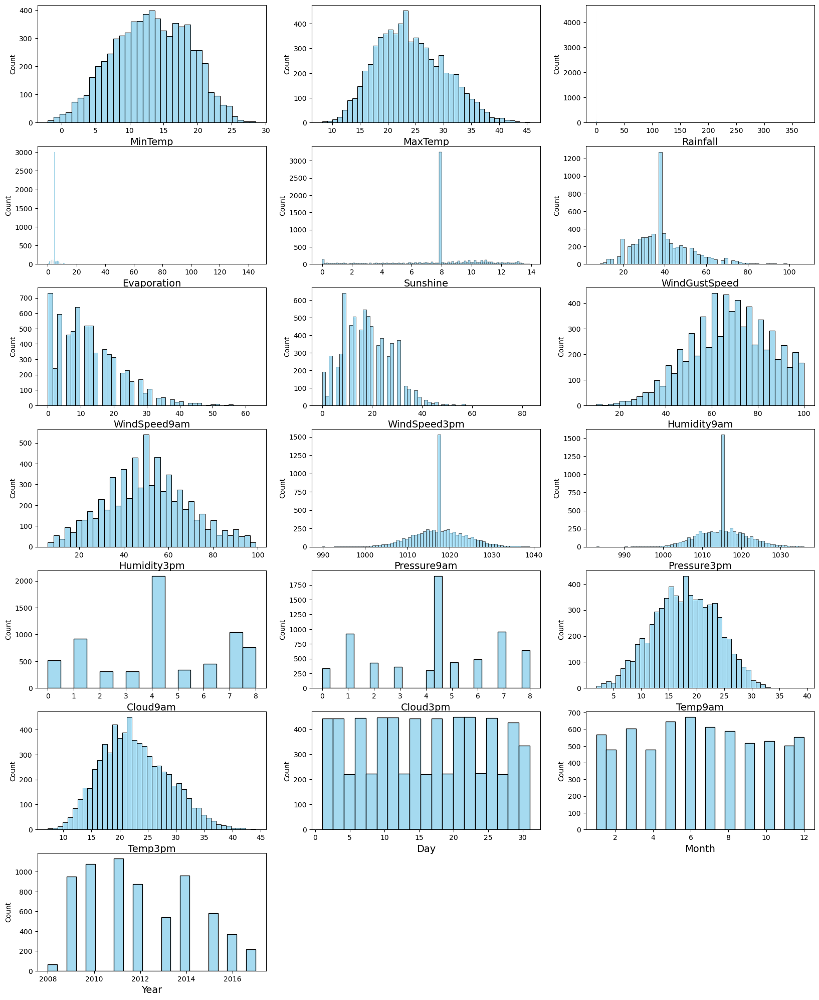

In [34]:
#Visiualizing it using Histogram
plt.figure(figsize=(20,25), facecolor='white')
plotnumber =1
for column in numerical_columns:
    if plotnumber <=20:
        ax = plt.subplot(7,3,plotnumber)
        sns.histplot(df[column], color='skyblue')
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.show()

In [35]:
cat_col = categorical_columns[:-1]

# Iterate through each categorical column
for col in cat_col:
    
    # Group by 'Income' and the current categorical column
    Income_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'Income' for each category in the current column
    Income_percentages = (Income_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Income_df = pd.concat([Income_counts, Income_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Income_df)
    print('*'*60)

                           Count  Percentage
RainTomorrow Location                       
No           Adelaide        160       78.05
             Albury          708       78.06
             Brisbane        444       76.68
             CoffsHarbour    425       69.56
             Darwin          218       87.20
             Melbourne       608       74.97
             Newcastle       624       75.91
             Penrith         366       75.93
             PerthAirport    962       79.90
             Uluru            39      100.00
             Williamtown     462       75.12
             Wollongong      174       73.42
Yes          Adelaide         45       21.95
             Albury          199       21.94
             Brisbane        135       23.32
             CoffsHarbour    186       30.44
             Darwin           32       12.80
             Melbourne       203       25.03
             Newcastle       198       24.09
             Penrith         116       24.07
          

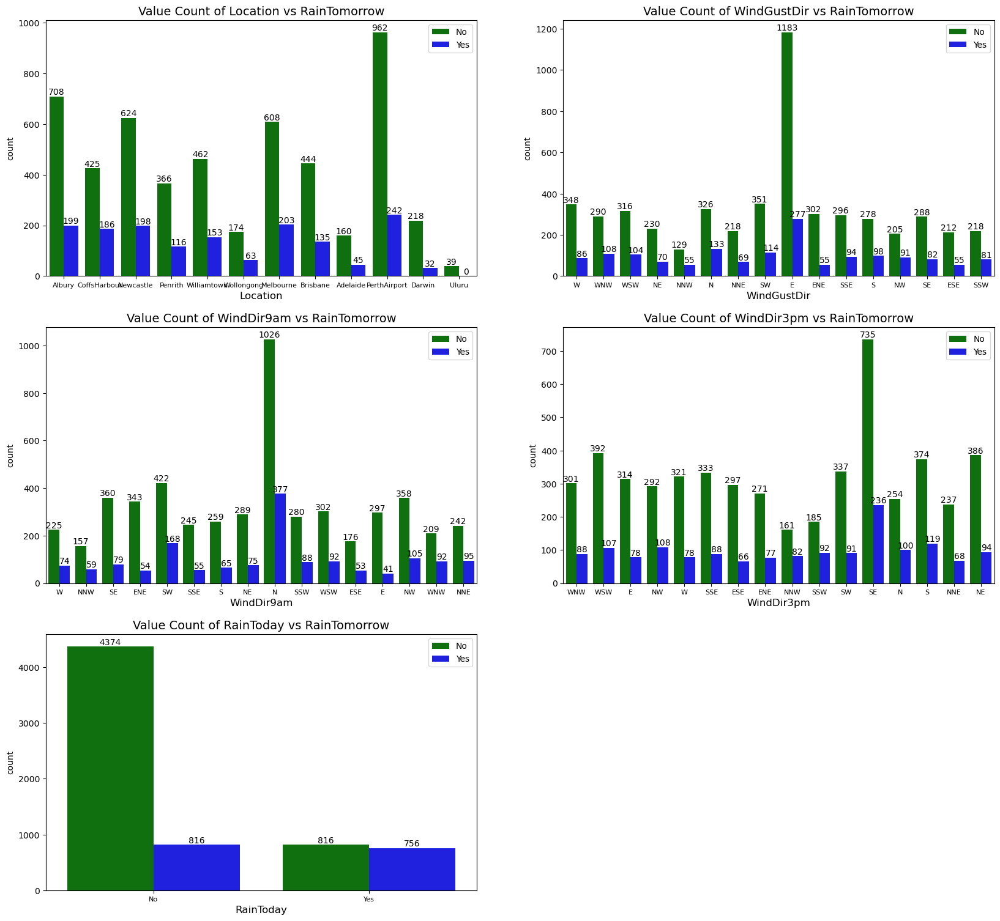

In [36]:
# Visualization of Categorical column Vs RainTomorrow
plt.figure(figsize=(20,25))
p=1

for i in cat_col:
    if p<=8:
        plt.subplot(4,2,p)
        custom_palette = {"Yes": "Blue", "No": "green"}
        ax= sns.countplot(x=i, hue='RainTomorrow',data=df, palette=custom_palette)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Value Count of {i} vs RainTomorrow', fontsize=14)
        plt.xlabel(i, fontsize=12)
        plt.xticks(fontsize=8)
        plt.legend()
    p+=1
plt.show()

In [37]:
# Iterate through each categorical column
for col in categorical_columns:
    
    # Group by 'Rainfall' and the current categorical column
    Rainfall_counts = df.groupby(['Rainfall', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['Rainfall'].count()
    
    # Calculate the percentage of 'Rainfall' for each category in the current column
    Rainfall_percentages = (Rainfall_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Rainfall_df = pd.concat([Rainfall_counts, Rainfall_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Rainfall_df)
    print('*'*60)


                       Count  Percentage
Rainfall Location                       
0.0      Adelaide        145       70.73
         Albury          616       67.92
         Brisbane        382       65.98
         CoffsHarbour    375       61.37
         Darwin          206       82.40
...                      ...         ...
142.2    Darwin            1        0.40
168.4    Brisbane          1        0.17
225.0    Williamtown       1        0.16
240.0    Newcastle         1        0.12
371.0    CoffsHarbour      1        0.16

[873 rows x 2 columns]
************************************************************
                      Count  Percentage
Rainfall WindGustDir                   
0.0      E              993       68.01
         ENE            290       81.23
         ESE            188       70.41
         N              344       74.95
         NE             220       73.33
...                     ...         ...
142.2    WNW              1        0.25
168.4    NE           

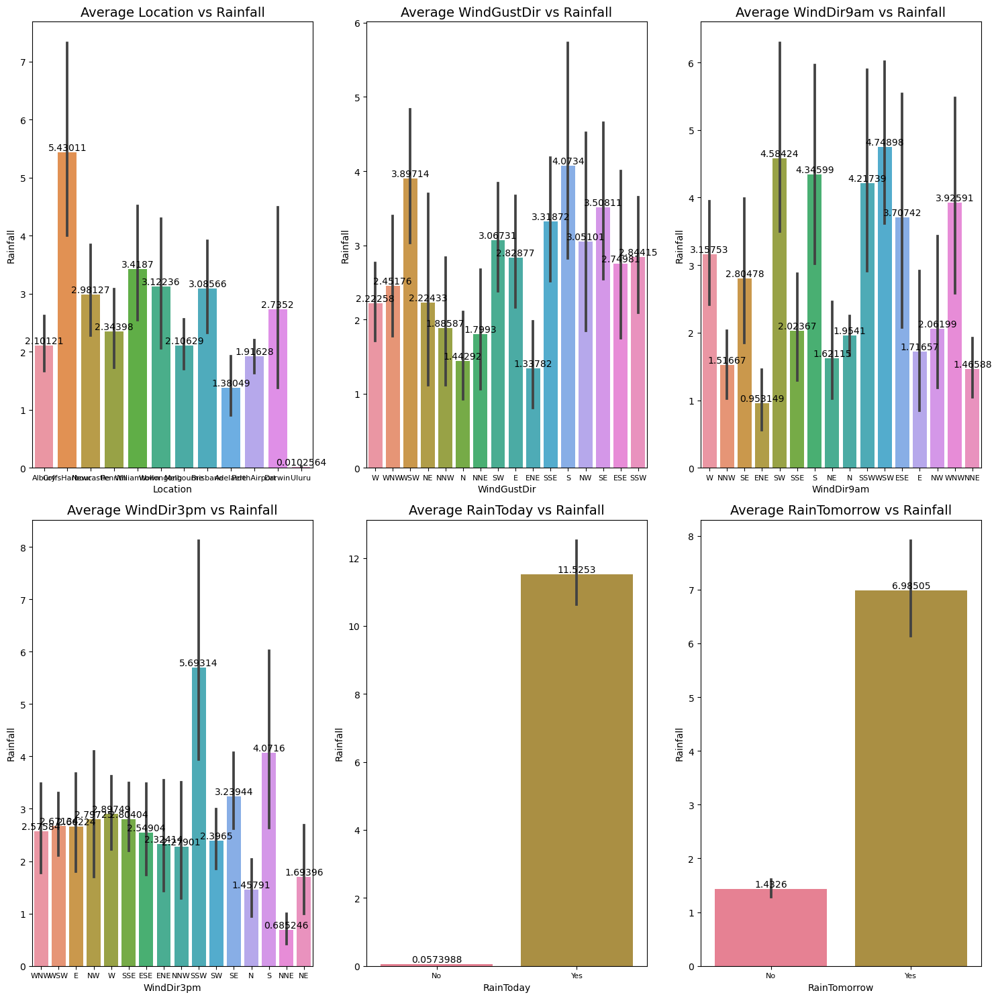

In [38]:
# Visualization of Categorical column Vs Rainfall
plt.figure(figsize=(15, 15))
p = 1

for i in categorical_columns:
    if p <= 6:
        plt.subplot(2, 3, p)
        ax = sns.barplot(x=i, y='Rainfall', data=df)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Average {i} vs Rainfall', fontsize=14)
        plt.xticks(fontsize=8)
    p += 1

plt.tight_layout()
plt.show()

In [39]:
# Iterate through each numerical column
for col in numerical_columns:
    # Group by 'RainTommorrow' and the current numerical column
    RainTomorrow_counts = df.groupby(['RainTomorrow', col])[col].count()
    
    # Calculate the total count for each numeric in the current column
    total_counts = df.groupby(col)['RainTomorrow'].count()
    
    # Calculate the percentage of 'RainTomorrow' for each category in the current column
    RainTomorrow_percentages = (RainTomorrow_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    RainTomorrow_df = pd.concat([RainTomorrow_counts, RainTomorrow_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(RainTomorrow_df)
    print('\n')

                      Count  Percentage
RainTomorrow MinTemp                   
No           -2.0         2      100.00
             -1.7         1      100.00
             -1.5         1      100.00
             -1.4         1      100.00
             -1.3         2      100.00
...                     ...         ...
Yes           25.6        1       33.33
              25.8        2       66.67
              25.9        1      100.00
              26.2        1       33.33
              27.0        2      100.00

[525 rows x 2 columns]


                      Count  Percentage
RainTomorrow MaxTemp                   
No           8.2          1      100.00
             8.3          1      100.00
             9.4          1      100.00
             9.6          2      100.00
             9.8          1       33.33
...                     ...         ...
Yes          40.3         1       25.00
             41.4         1      100.00
             41.5         1       50.00
             4

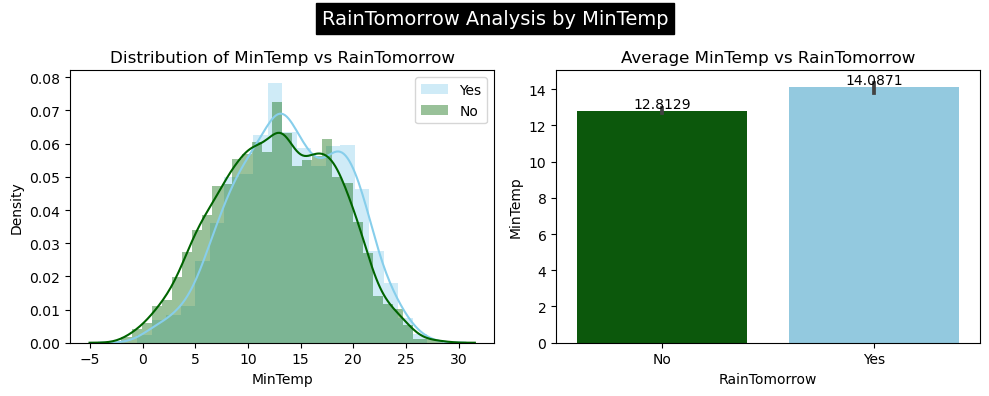

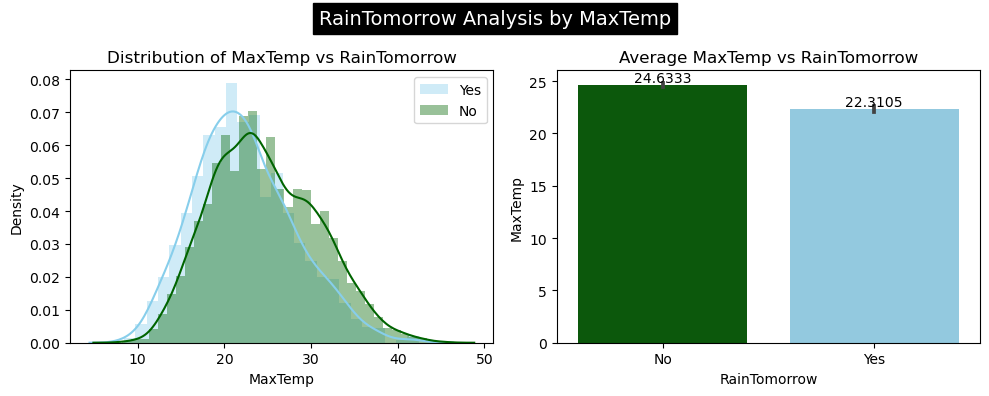

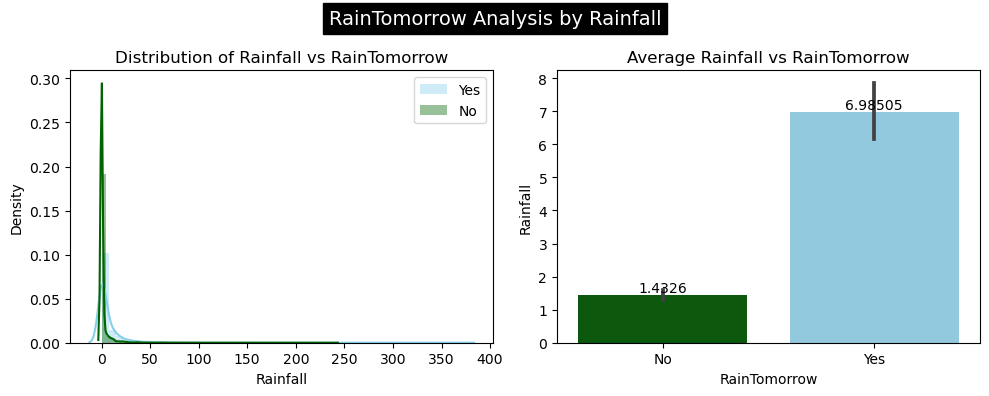

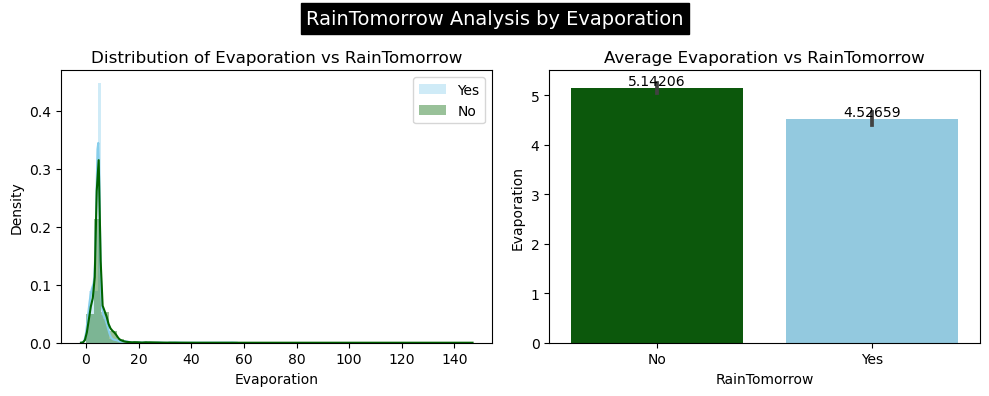

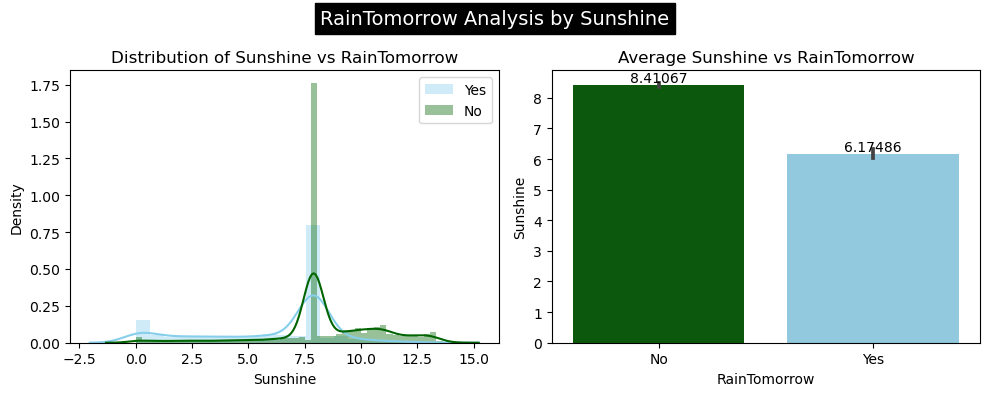

...

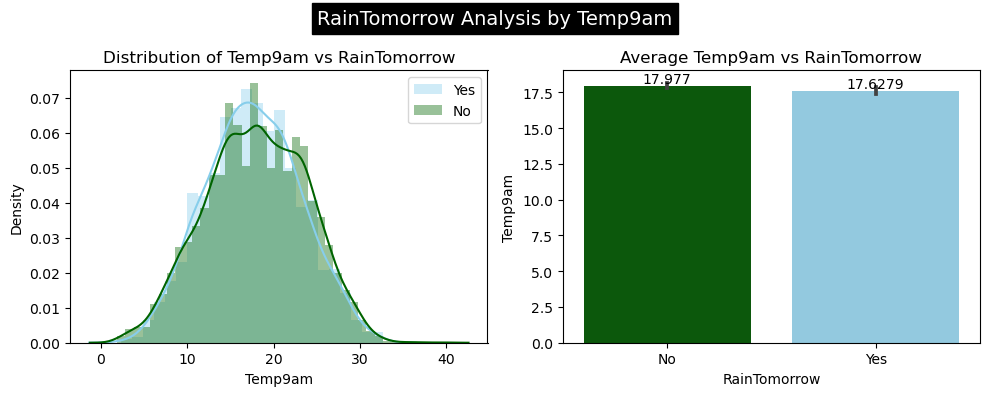

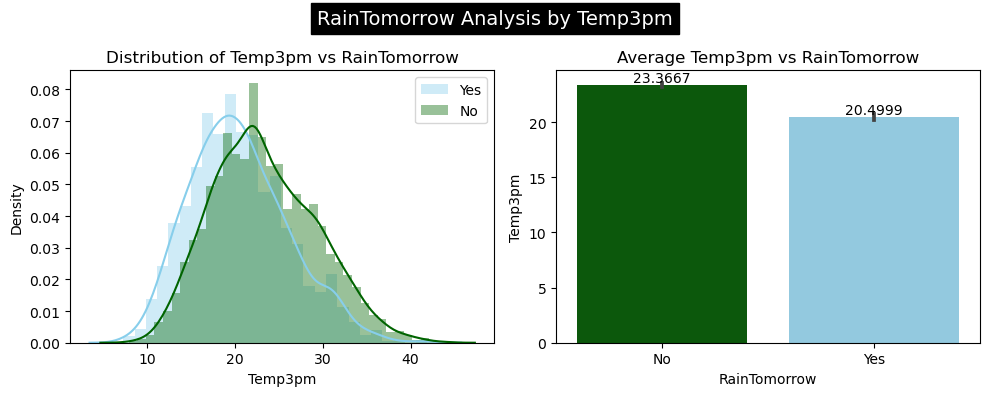

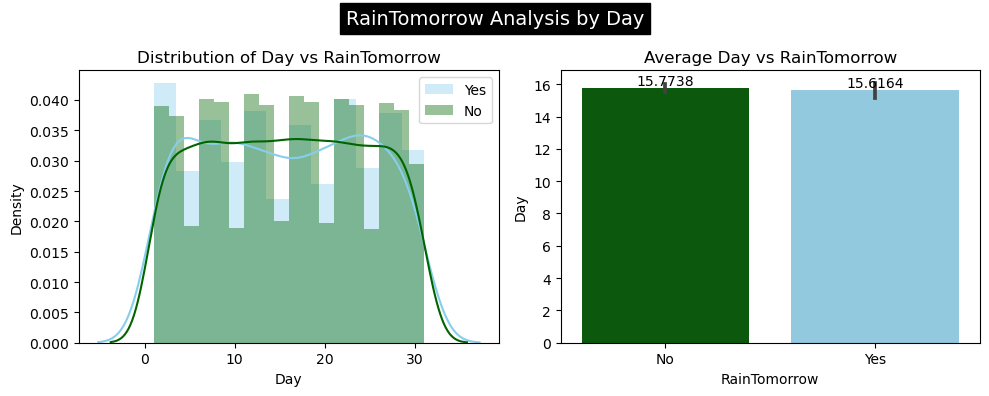

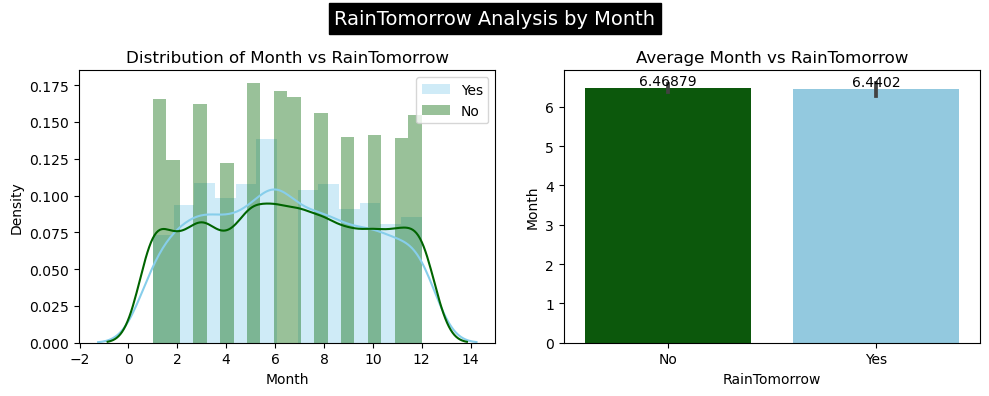

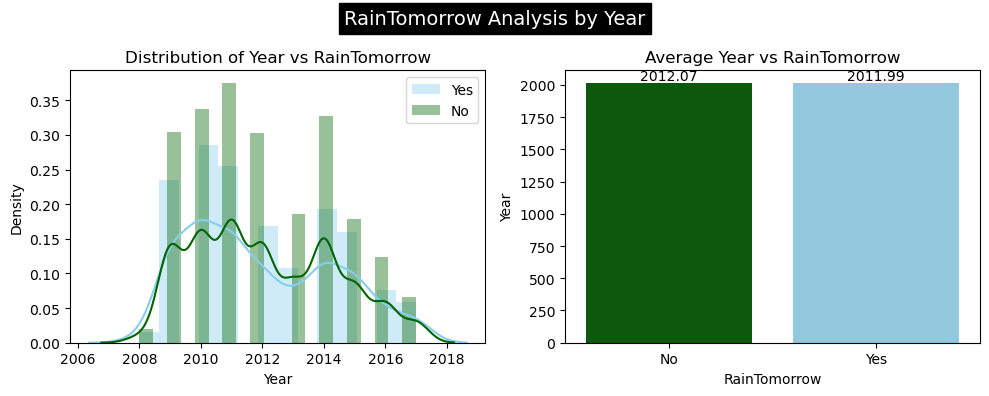

In [40]:
# Visualizing it:
for i in numerical_columns:
    
    #create Subplots
    fig, axes =plt.subplots(1,2,figsize=(10,4))
    
    # First Plot: Distribution of Numerical columns vs RainTomorrow
    sns.distplot(df[df['RainTomorrow']=="Yes"][i], label= "Yes", color='skyblue', ax=axes[0])
    sns.distplot(df[df['RainTomorrow']=="No"][i],label="No", color='Darkgreen', ax=axes[0])
    axes[0].set_title(f"Distribution of {i} vs RainTomorrow")
    axes[0].legend()
    
    # Second Plot: Avg. Numerical columns vs Income
    ax=sns.barplot(x='RainTomorrow', y=i, data=df, palette={"Yes": "skyblue", "No": "Darkgreen"}, ax=axes[1])
    for container in ax.containers:
        ax.bar_label(container)
    axes[1].set_title(f'Average {i} vs RainTomorrow')
    
    fig.suptitle(f"RainTomorrow Analysis by {i}", fontsize=14, backgroundcolor='black',color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

In [41]:
# Iterate through each numerical column
for col in numerical_columns:
    
    # Group by 'Rainfall' and the current categorical column
    Rainfall_counts = df.groupby(['Rainfall', col])[col].count()
    
    # Calculate the total count for each category in the current column
    total_counts = df.groupby(col)['Rainfall'].count()
    
    # Calculate the percentage of 'Rainfall' for each category in the current column
    Rainfall_percentages = (Rainfall_counts / total_counts * 100).round(2)
    
    # Create a DataFrame to display the counts and percentages
    Rainfall_df = pd.concat([Rainfall_counts, Rainfall_percentages], axis=1, keys=['Count', 'Percentage'])
    
    # Print the results
    print(Rainfall_df)
    print('*'*60)

                     Count  Percentage
Rainfall MinTemp                      
0.0      -2.000000       2      100.00
         -1.700000       1      100.00
         -1.500000       1      100.00
         -1.400000       1      100.00
         -1.300000       2      100.00
...                    ...         ...
142.2     24.100000      1       16.67
168.4     21.300000      1        4.76
225.0     18.500000      1        2.27
240.0     13.109145      1        1.43
371.0     17.400000      1        4.35

[2253 rows x 2 columns]
************************************************************
                  Count  Percentage
Rainfall MaxTemp                   
0.0      8.2          1      100.00
         8.3          1      100.00
         8.4          1      100.00
         8.8          1       50.00
         9.4          1      100.00
...                 ...         ...
142.2    29.8         1        2.63
168.4    26.6         1        3.70
225.0    19.9         1        2.78
240.0    21

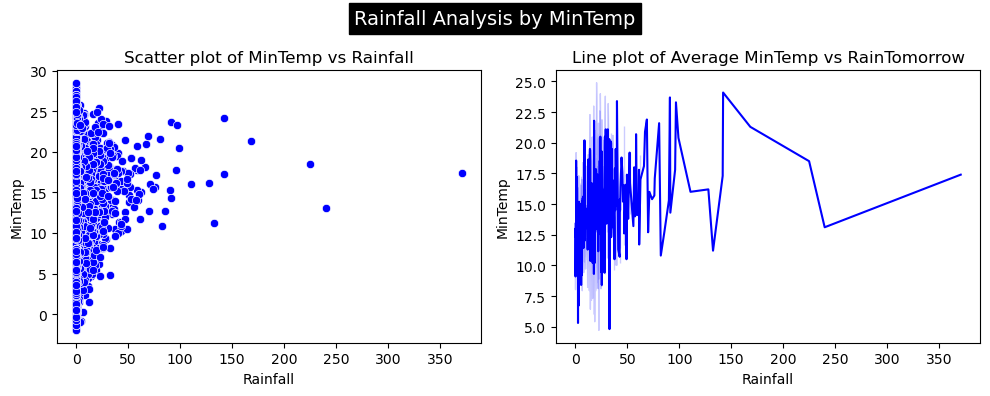

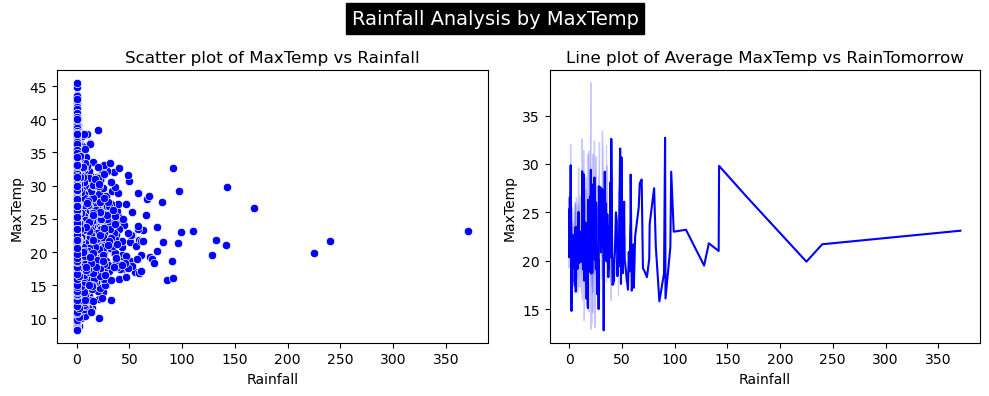

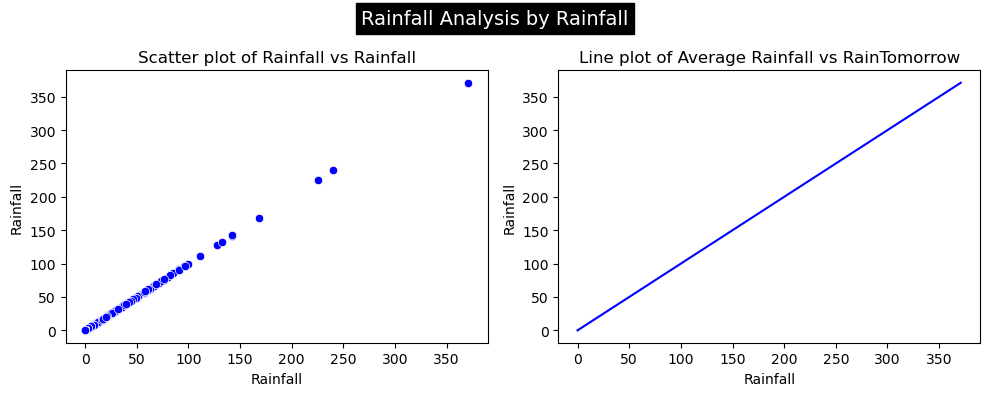

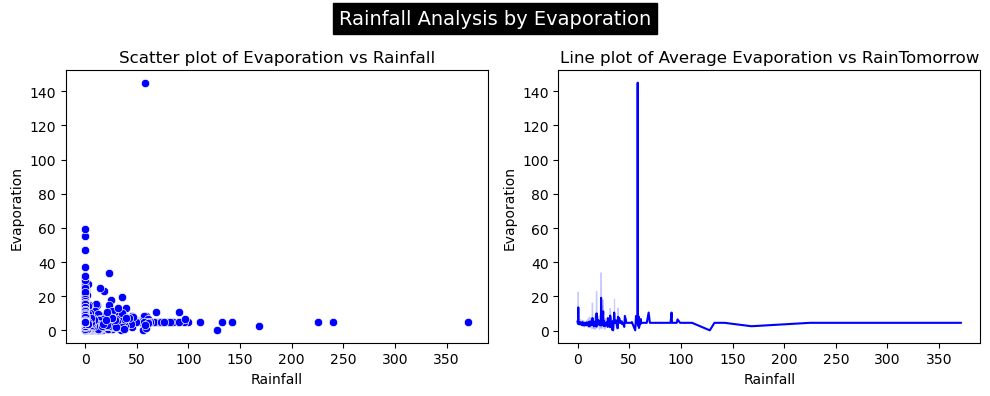

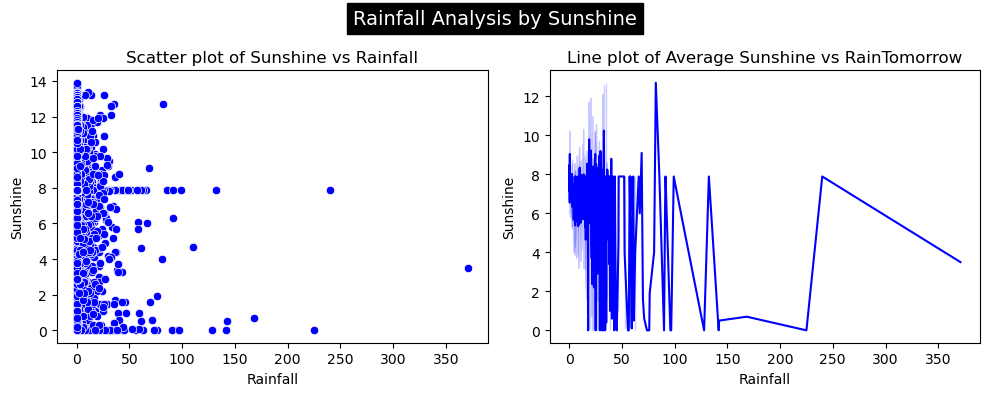

...

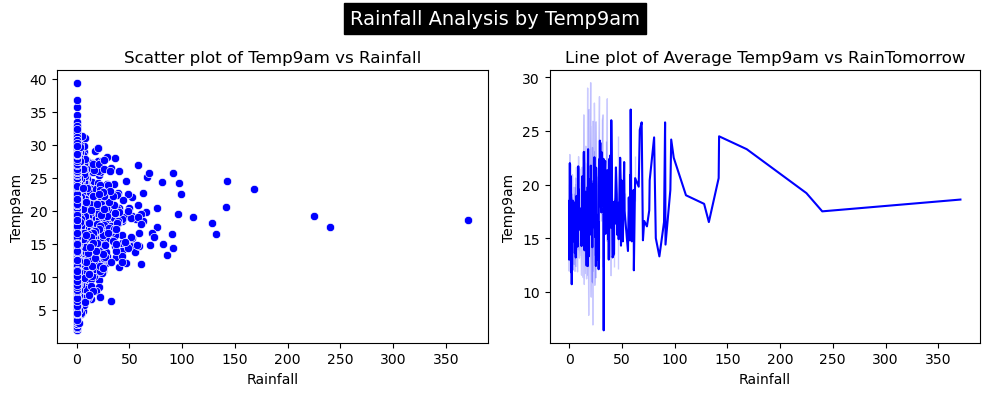

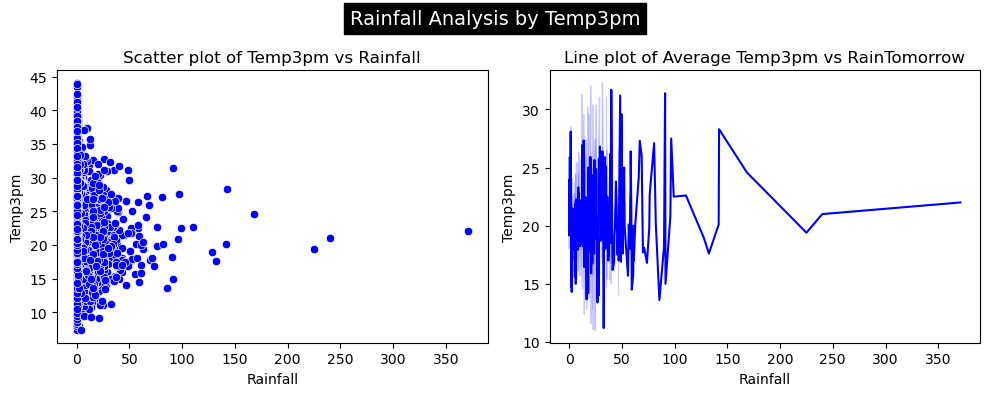

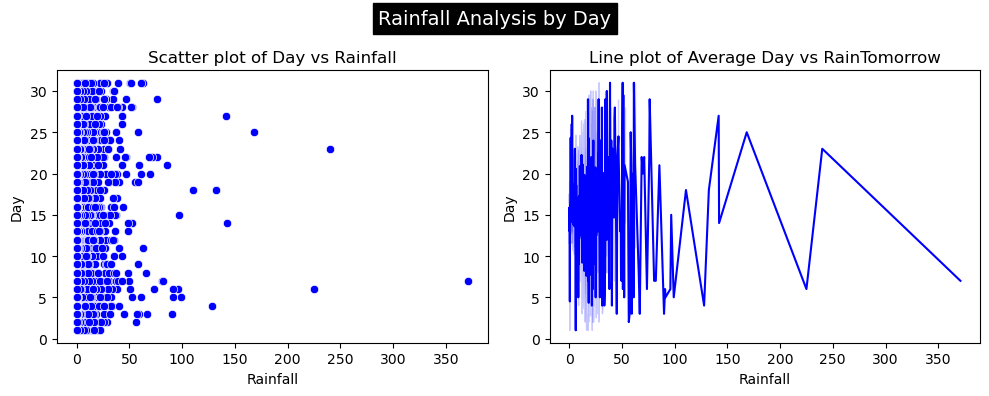

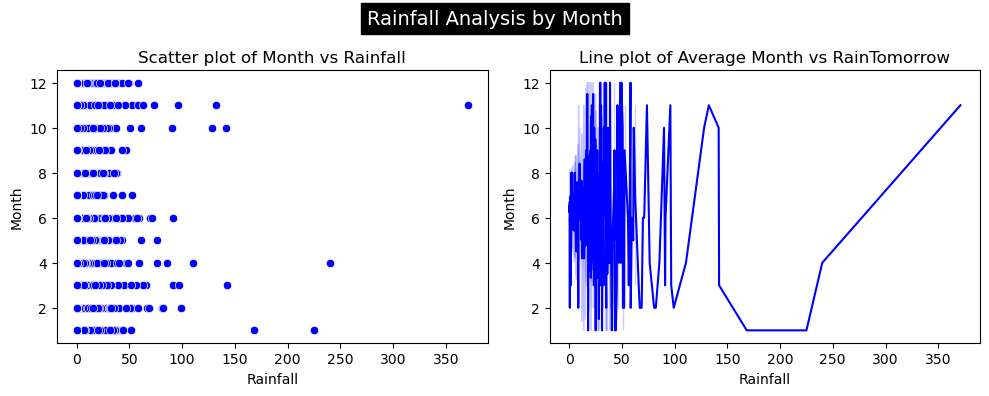

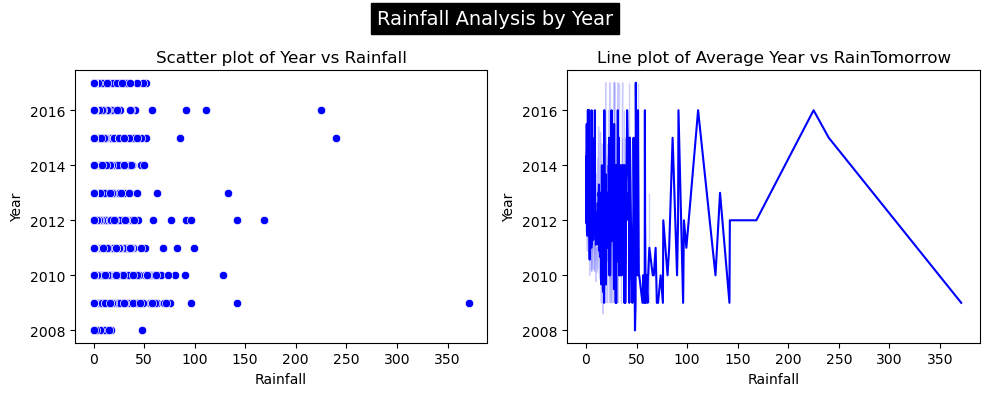

In [42]:
# Visualizing it:
for i in numerical_columns:
    
    # Create Subplots
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    
    # First Plot: Scatter plot of Numerical columns vs Rainfall
    sns.scatterplot(x='Rainfall', y=i, data=df, color='blue', ax=axes[0])
    axes[0].set_title(f"Scatter plot of {i} vs Rainfall")
    
    # Second Plot: Line plot of Avg. Numerical columns vs Rainfall
    ax = sns.lineplot(x='Rainfall', y=i, data=df, color='blue', ax=axes[1])
    axes[1].set_title(f'Line plot of Average {i} vs RainTomorrow')
    
    fig.suptitle(f"Rainfall Analysis by {i}", fontsize=14, backgroundcolor='black', color='white')
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

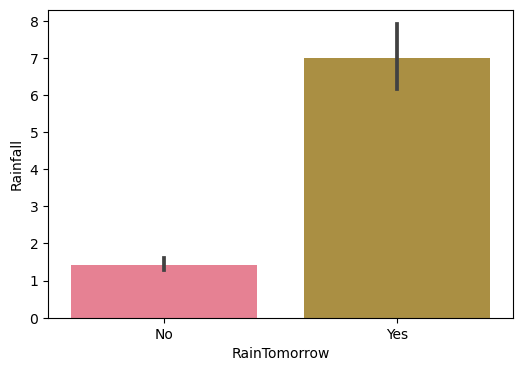

In [43]:
# RainTomorrow Vs Rainfall
plt.figure(figsize=(6,4))
sns.barplot(x=df['RainTomorrow'], y=df['Rainfall'])
plt.show()

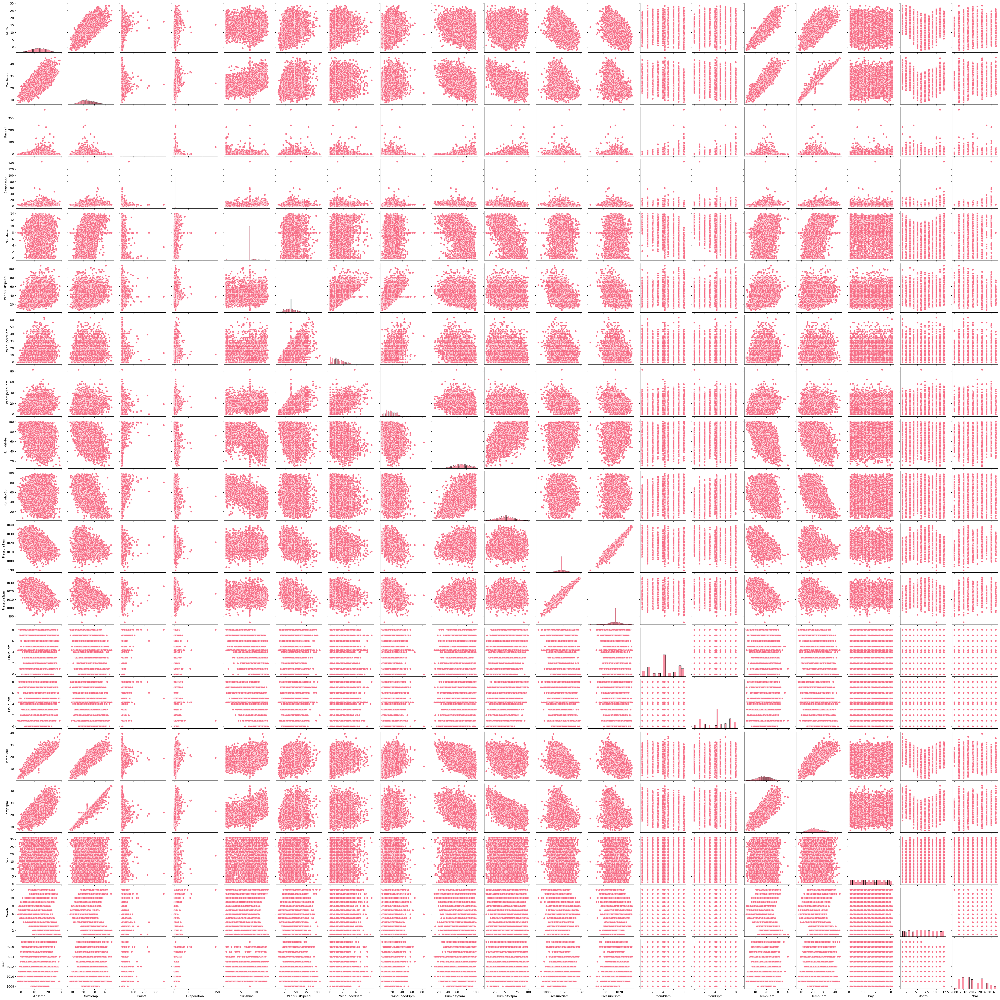

In [44]:
sns.pairplot(df)
plt.show()

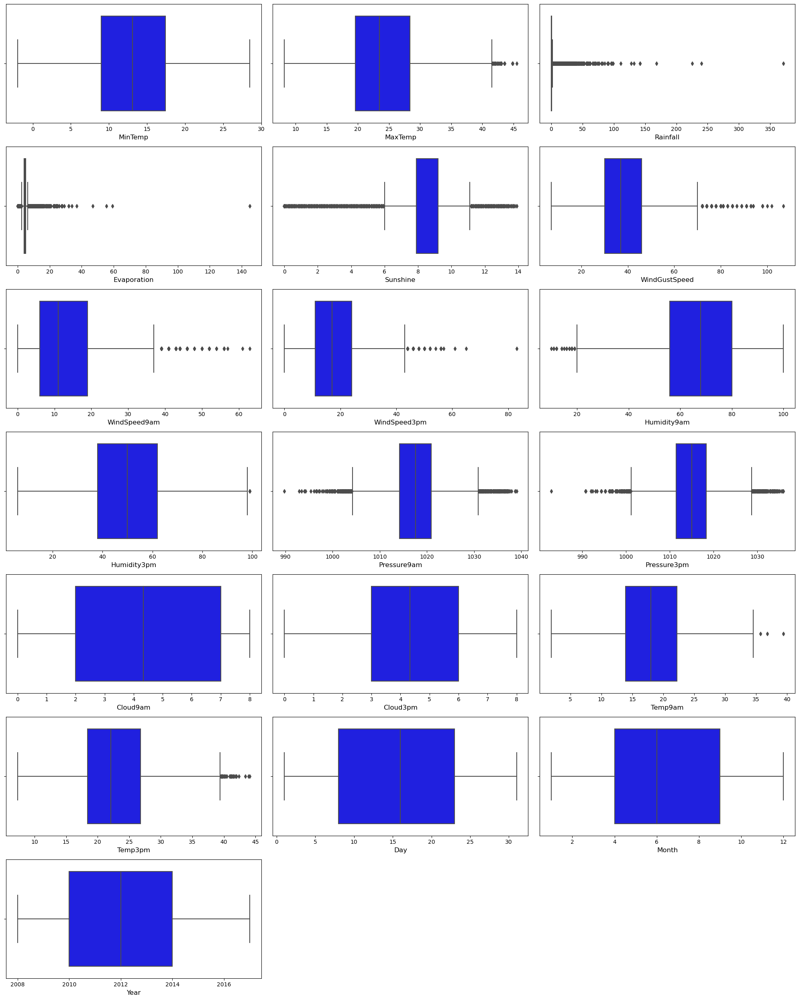

In [45]:
# Identifying the outliers present in numerical columns using boxplot
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_columns:
    if plotnumber<=20:
        ax=plt.subplot(7,3,plotnumber)
        sns.boxplot(x=col, data=df,color='blue')
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

In [46]:
# Creating a list with Columns which has outliers
outlier_columns=['MaxTemp', 'Rainfall', 'Evaporation',
                 'Sunshine','WindGustSpeed', 'WindSpeed9am',
                 'WindSpeed3pm', 'Humidity9am','Humidity3pm',
                 'Pressure9am', 'Pressure3pm','Temp9am', 'Temp3pm',]


# Calculate the z-scores for the specified numerical columns
z = np.abs(zscore(df[outlier_columns]))

# Create a new DataFrame df1 with rows where z-scores are less than 3 for all numerical columns
df1 = df[(z < 3).all(axis=1)]
df1.shape

(6405, 25)

In [47]:
df2 = df.copy()

for column in outlier_columns:
    IQR = df2[column].quantile(0.75)-df2[column].quantile(0.25)
    lower_bridge = df2[column].quantile(0.25) - (IQR * 1.5)
    upper_bridge = df2[column].quantile(0.75) + (IQR * 1.5)
    
    # Remove outliers
    df2 = df2[~((df2[column] < lower_bridge) | (df2[column] > upper_bridge))]

# Print the shape of the DataFrame after outlier removal
print("Shape after outlier removal:", df2.shape)

Shape after outlier removal: (2351, 25)


In [48]:
# checking the data loss for zscore
data_loss_zscore = (6762-6405)/6405*100
print('Dataloss using zscore:',data_loss_zscore)

# checking the data loss for IQR
data_loss_IQR = (6405-2351)/6405*100
print('Dataloss using IQR:',data_loss_IQR)

Dataloss using zscore: 5.573770491803279
Dataloss using IQR: 63.294301327088206


In [49]:
# Choosing zscore for outlier treatment
df=df1

# Checking the shape of our dataframe after removing outliers using Zscore
df.shape

(6405, 25)

In [50]:
#Saving Clean Data
file_path = "clean_data_Rainfall.csv"
df.to_csv(file_path, index=False)

In [51]:
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         3.520665
Evaporation      1.118992
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am     0.682369
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
Day              0.005249
Month            0.032796
Year             0.352952
dtype: float64

In [52]:
# Treating Skewness
# Columns to be transformed
skew_columns = ['Rainfall', 'Evaporation', 'WindSpeed9am']

# Initialize the PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

df[skew_columns] = scaler.fit_transform(df[skew_columns].values)

# Checking Skewness after treating skewness
df.skew()

MinTemp         -0.078085
MaxTemp          0.267864
Rainfall         1.065122
Evaporation      0.060615
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am    -0.130923
WindSpeed3pm     0.344082
Humidity9am     -0.234330
Humidity3pm      0.156516
Pressure9am      0.066558
Pressure3pm      0.092315
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071905
Temp3pm          0.293455
Day              0.005249
Month            0.032796
Year             0.352952
dtype: float64

In [53]:
# Initating Label Encoder
le = LabelEncoder()

#Iterate over Categorical columns
for i in categorical_columns:
    df[i] = le.fit_transform(df[i])

df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.802149,0.019152,7.890896,13,44.0,13,14,...,1007.1,8.000000,4.320988,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,-0.646716,0.019152,7.890896,14,44.0,6,15,...,1007.8,4.336806,4.320988,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,-0.646716,0.019152,7.890896,15,46.0,13,15,...,1008.7,4.336806,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,-0.646716,0.019152,7.890896,4,24.0,9,0,...,1012.8,4.336806,4.320988,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.165262,0.019152,7.890896,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


In [54]:
df_cor = df.corr()
df_cor


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.091711,0.073163,0.003313,0.109779,0.058077,-0.086740,0.269819,-0.102867,-0.000110,...,-0.018292,-0.005569,-0.004753,0.098836,0.069084,-0.004064,0.001047,-0.004824,-0.070775,0.504642
MinTemp,0.091711,1.000000,0.730443,0.071254,0.385046,0.046470,-0.142466,0.244192,-0.021335,-0.143475,...,-0.447498,0.094939,0.044612,0.892863,0.699937,0.072284,0.092327,0.018313,-0.235969,0.034034
MaxTemp,0.073163,0.730443,1.000000,-0.249556,0.488757,0.358502,-0.202044,0.171035,-0.192569,-0.165304,...,-0.425968,-0.240513,-0.239326,0.865546,0.975189,-0.219597,-0.158306,0.019890,-0.172224,0.083746
Rainfall,0.003313,0.071254,-0.249556,1.000000,-0.213268,-0.271955,0.112559,0.070265,0.152918,0.113943,...,-0.029997,0.318495,0.277897,-0.107258,-0.260766,0.931729,0.329587,-0.009313,-0.006195,0.007281
Evaporation,0.109779,0.385046,0.488757,-0.213268,1.000000,0.416652,-0.121925,0.213578,-0.113451,-0.028743,...,-0.306972,-0.132476,-0.176777,0.455848,0.475805,-0.184877,-0.111478,0.007102,-0.041669,0.092125
Sunshine,0.058077,0.046470,0.358502,-0.271955,0.416652,1.000000,-0.094801,0.039405,-0.078618,-0.053638,...,-0.084836,-0.534641,-0.557336,0.243782,0.376608,-0.237414,-0.333100,-0.001910,0.003092,0.053708
WindGustDir,-0.086740,-0.142466,-0.202044,0.112559,-0.121925,-0.094801,1.000000,0.023365,0.381934,0.456003,...,-0.006673,0.113068,0.073411,-0.158453,-0.212044,0.108370,0.033716,0.016802,0.032303,-0.184168
WindGustSpeed,0.269819,0.244192,0.171035,0.070265,0.213578,0.039405,0.023365,1.000000,-0.062442,0.089590,...,-0.326115,0.002130,0.036652,0.224791,0.139337,0.078237,0.163852,-0.002839,0.047766,-0.032164
WindDir9am,-0.102867,-0.021335,-0.192569,0.152918,-0.113451,-0.078618,0.381934,-0.062442,1.000000,0.207862,...,0.058139,0.070301,0.053819,-0.067128,-0.200892,0.149877,0.034460,-0.007582,0.020991,-0.082950
WindDir3pm,-0.000110,-0.143475,-0.165304,0.113943,-0.028743,-0.053638,0.456003,0.089590,0.207862,1.000000,...,-0.041407,0.069949,0.048944,-0.150248,-0.176879,0.095332,-0.000168,0.001450,0.029916,0.005258


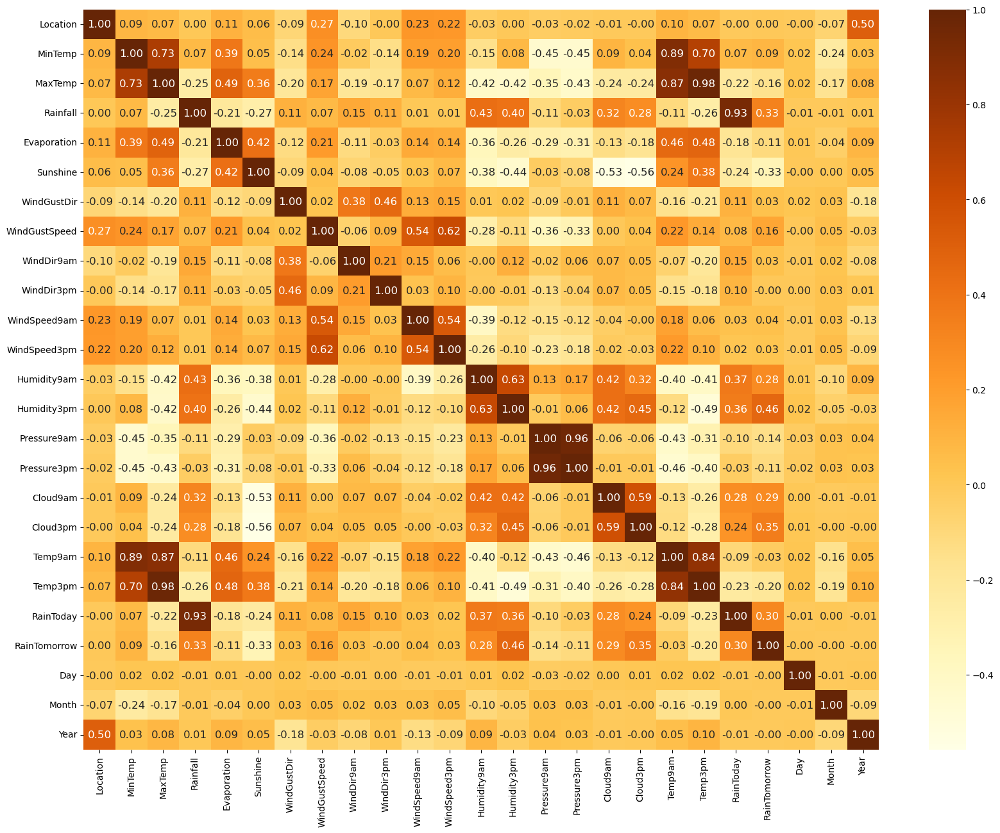

In [55]:
# Visualizing it
plt.figure(figsize=(20, 15))
sns.heatmap(df_cor, annot=True, fmt='.2F', cmap='YlOrBr', annot_kws={"size": 12})
plt.show()

In [56]:
correlation_threshold = 0.85
mask = df_cor.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_cor.columns)):
    for j in range(i+1, len(df_cor.columns)):
        if mask.iloc[i, j]:
            colname_i = df_cor.columns[i]
            colname_j = df_cor.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [57]:
# Calling the function:
features_to_drop

{'Pressure3pm', 'RainToday', 'Temp3pm', 'Temp9am'}

In [58]:
# dropping irrelevant columns
df.drop(columns=['Pressure3pm', 'Temp3pm', 'Temp9am', 'RainToday'],axis=1,inplace=True)

In [59]:
df.shape # checking the shape after dropping correlated columns

(6405, 21)

In [60]:
# Copying dataframe
df1 = df.copy()

In [61]:
#correlation with target column(RainTomorrow)
correlation_with_RainTomorrow = df.corr()['RainTomorrow'].abs().sort_values(ascending=False)
print(correlation_with_RainTomorrow)

RainTomorrow     1.000000
Humidity3pm      0.463724
Cloud3pm         0.350736
Sunshine         0.333100
Rainfall         0.329587
Cloud9am         0.286797
Humidity9am      0.283625
WindGustSpeed    0.163852
MaxTemp          0.158306
Pressure9am      0.139487
Evaporation      0.111478
MinTemp          0.092327
WindSpeed9am     0.041446
WindDir9am       0.034460
WindGustDir      0.033716
WindSpeed3pm     0.026138
Month            0.003892
Year             0.003841
Day              0.002229
Location         0.001047
WindDir3pm       0.000168
Name: RainTomorrow, dtype: float64


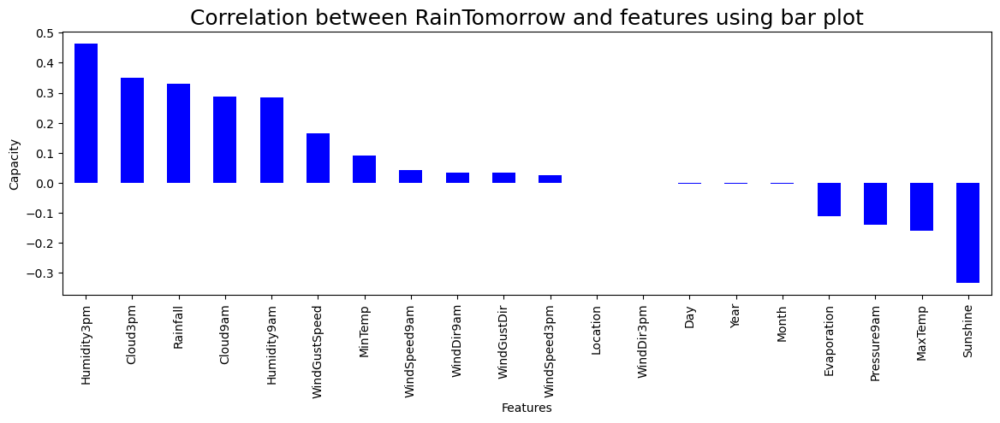

In [62]:
plt.figure(figsize=(14,4))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='blue')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between RainTomorrow and features using bar plot',fontsize=18)
plt.show()

In [63]:
# dropping irrelevant columns
df.drop(columns=['WindDir3pm','Location','Day','Year', 'Month'],axis=1,inplace=True)

In [64]:
df.shape

(6405, 16)

In [65]:
#correlation with target column(Rainfall)
correlation_with_Rainfall = df1.corr()['Rainfall'].abs().sort_values(ascending=False)
print(correlation_with_Rainfall)

Rainfall         1.000000
Humidity9am      0.425329
Humidity3pm      0.404194
RainTomorrow     0.329587
Cloud9am         0.318495
Cloud3pm         0.277897
Sunshine         0.271955
MaxTemp          0.249556
Evaporation      0.213268
WindDir9am       0.152918
WindDir3pm       0.113943
WindGustDir      0.112559
Pressure9am      0.107907
MinTemp          0.071254
WindGustSpeed    0.070265
Day              0.009313
WindSpeed3pm     0.007377
WindSpeed9am     0.007322
Year             0.007281
Month            0.006195
Location         0.003313
Name: Rainfall, dtype: float64


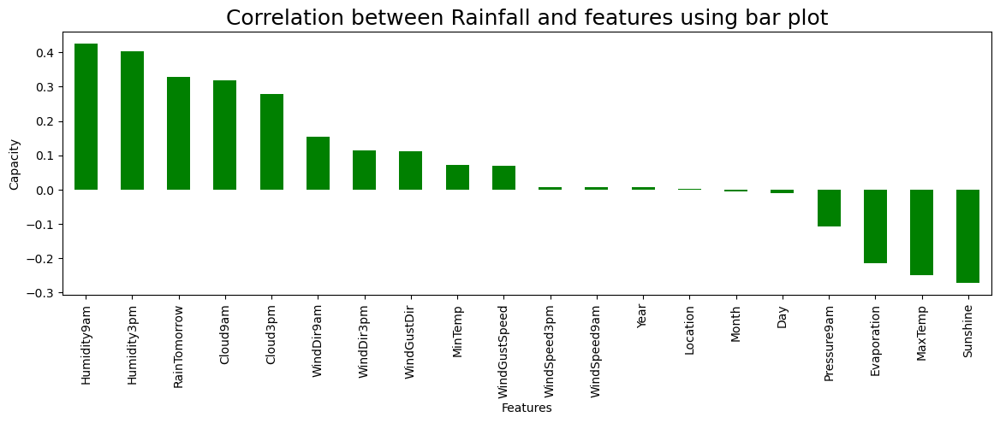

In [66]:
plt.figure(figsize=(14,4))
df1.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='green')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between Rainfall and features using bar plot',fontsize=18)
plt.show()

In [67]:
# dropping irrelevant columns
df1.drop(columns=['Day', 'WindSpeed3pm', 'WindSpeed9am','Year', 'Month', 'Location'],axis=1,inplace=True)

In [68]:
df1.shape

(6405, 15)

In [69]:
# Splitting data in target and dependent feature
X = df.drop(['RainTomorrow'], axis =1)
Y = df['RainTomorrow']

# Checking the dimenstion of X & Y
X.shape, Y.shape

((6405, 15), (6405,))

In [70]:
# Splitting data in target and dependent feature
X1 = df1.drop(['Rainfall'], axis =1)
Y1 = df1['Rainfall']

# Checking the dimenstion of X1 & Y1
X1.shape, Y1.shape

((6405, 14), (6405,))

In [71]:
#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X_scale = scaler.fit_transform(X)

# Create a DataFrame view of the scaled features after preprocessing
X = pd.DataFrame(X_scale, columns=X.columns)
X

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm
0,0.069957,-0.189586,0.802149,0.019152,-0.018878,1.222871,0.506587,1.317529,0.907717,0.757422,0.199656,-1.560526,-1.759471,1.496298,0.018004
1,-1.013228,0.175602,-0.646716,0.019152,-0.018878,1.413823,0.506587,-0.222754,-0.856432,0.536834,-1.396033,-1.395549,-1.252405,0.014970,0.018004
2,-0.020308,0.275199,-0.646716,0.019152,-0.018878,1.604776,0.669986,1.317529,0.825275,0.978010,-1.750630,-1.120587,-1.776956,0.014970,-0.982944
3,-0.688272,0.656987,-0.646716,0.019152,-0.018878,-0.495701,-1.127400,0.437367,0.070417,-0.896990,-1.336933,-1.890480,-0.028454,0.014970,0.018004
4,0.810134,1.370764,1.165262,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.408178,0.316245,0.849752,-0.955609,-1.217435,1.091917,1.604613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,-0.646716,0.019152,-0.018878,-1.259511,-0.555505,0.437367,0.278719,-0.676402,-0.982336,-1.450541,1.195498,0.014970,0.018004
6401,-1.699245,0.208801,-0.646716,0.019152,-0.018878,-0.113796,-1.290799,0.437367,0.278719,-0.896990,-0.686838,-1.615518,1.003162,0.014970,0.018004
6402,-1.374290,0.474392,-0.646716,0.019152,-0.018878,-0.686654,-0.065308,0.437367,-0.156543,-0.896990,-0.864137,-1.450541,0.566037,0.014970,0.018004
6403,-0.941016,0.490992,-0.646716,0.019152,-0.018878,0.459061,-0.800603,0.657407,0.278719,-1.117578,-0.982336,-1.450541,0.286277,-0.525609,-0.982944


In [72]:
#Instantiate Standard Scaler
scaler= StandardScaler()

# Fit and transform the scaler on the features
X1_scale = scaler.fit_transform(X1)

# Create a DataFrame view of the scaled features after preprocessing
X1 = pd.DataFrame(X1_scale, columns=X1.columns)
X1

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainTomorrow
0,0.069957,-0.189586,0.019152,-0.018878,1.222871,0.506587,1.317529,1.373286,0.199656,-1.560526,-1.759471,1.496298,0.018004,-0.535408
1,-1.013228,0.175602,0.019152,-0.018878,1.413823,0.506587,-0.222754,1.596561,-1.396033,-1.395549,-1.252405,0.014970,0.018004,-0.535408
2,-0.020308,0.275199,0.019152,-0.018878,1.604776,0.669986,1.317529,1.596561,-1.750630,-1.120587,-1.776956,0.014970,-0.982944,-0.535408
3,-0.688272,0.656987,0.019152,-0.018878,-0.495701,-1.127400,0.437367,-1.752556,-1.336933,-1.890480,-0.028454,0.014970,0.018004,-0.535408
4,0.810134,1.370764,0.019152,-0.018878,1.222871,0.261489,-1.322957,-0.189635,0.849752,-0.955609,-1.217435,1.091917,1.604613,-0.535408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6400,-1.843670,-0.106589,0.019152,-0.018878,-1.259511,-0.555505,0.437367,-1.529282,-0.982336,-1.450541,1.195498,0.014970,0.018004,-0.535408
6401,-1.699245,0.208801,0.019152,-0.018878,-0.113796,-1.290799,0.437367,-1.082733,-0.686838,-1.615518,1.003162,0.014970,0.018004,-0.535408
6402,-1.374290,0.474392,0.019152,-0.018878,-0.686654,-0.065308,0.437367,1.373286,-0.864137,-1.450541,0.566037,0.014970,0.018004,-0.535408
6403,-0.941016,0.490992,0.019152,-0.018878,0.459061,-0.800603,0.657407,-1.082733,-0.982336,-1.450541,0.286277,-0.525609,-0.982944,-0.535408


In [73]:
# Multicolinearity for first target
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X,i) for i in range(len(X.columns))]
vif["Features"] = X.columns
vif

,VIF values,Features
0,4.739989,MinTemp
1,5.511838,MaxTemp
2,1.468353,Rainfall
3,1.625433,Evaporation
4,1.988032,Sunshine
5,1.298674,WindGustDir
6,2.127301,WindGustSpeed
7,1.304946,WindDir9am
8,1.911293,WindSpeed9am
9,1.883827,WindSpeed3pm


In [74]:
# Multicolinearityu for second Target
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X1,i) for i in range(len(X1.columns))]
vif["Features"] = X1.columns
vif

,VIF values,Features
0,4.396276,MinTemp
1,5.163396,MaxTemp
2,1.609772,Evaporation
3,2.000198,Sunshine
4,1.467039,WindGustDir
5,1.364717,WindGustSpeed
6,1.283844,WindDir9am
7,1.329285,WindDir3pm
8,2.121443,Humidity9am
9,3.143478,Humidity3pm


In [75]:
Y.value_counts()

0    4978
1    1427
Name: RainTomorrow, dtype: int64

In [76]:
# Initiate over-sampler
sm=SMOTE()

X,Y=sm.fit_resample(X,Y)

# Checking Value count after applying SMOTE
Y.value_counts()

0    4978
1    4978
Name: RainTomorrow, dtype: int64

In [77]:
# Initialize all the classification models
LR_model = LogisticRegression()
Ridge_model = RidgeClassifier()
DT_model = DecisionTreeClassifier()
KNR_model = KNeighborsClassifier()
RFR_model = RandomForestClassifier()
XGB_model = XGBClassifier()
SDG_model = SGDClassifier()
BG_model = BaggingClassifier()
ADA_model = AdaBoostClassifier()
ET_model = ExtraTreesClassifier()

# Create a list of models for iteration
classification_models = [
    (LR_model, "Logistic Regression"),
    (DT_model, "Decision Tree Classifier"),
    (KNR_model, "K-Neighbors Classifier"),
    (RFR_model, "Random Forest Classifier"),
    (ET_model, "ExtraTrees Classifier"),
    (Ridge_model, "RidgeClassifier"),
    (XGB_model, "XGBClassifier"),
    (SDG_model, "SGDClassifier"),
    (BG_model, "BaggingClassifier"),
    (ADA_model, "AdaBoostClassifier"),
]

In [78]:
# best model for best Random State
# List to store model performance dictionaries
model_performances = []

# Iterate over the models and evaluate them using cross-validation
for model, model_name in classification_models:
    best_random_state = 0
    best_accuracy = 0
    best_cv_score = 0

    for random_state in range(1, 101):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
        model.fit(X_train, Y_train)
        Y_pred = model.predict(X_test)
        accuracy = accuracy_score(Y_test, Y_pred)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_random_state = random_state

    # Now, calculate the model's performance metrics using the best random state
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=best_random_state)
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(Y_test, Y_pred)
    conf_matrix = confusion_matrix(Y_test, Y_pred)
    classification_rep = classification_report(Y_test, Y_pred, output_dict=True)

    precision = classification_rep['weighted avg']['precision']
    recall = classification_rep['weighted avg']['recall']
    f1_score = classification_rep['weighted avg']['f1-score']
    support = classification_rep['weighted avg']['support']

    # Compute cross-validation score for the model after fitting
    cv_scores = cross_val_score(model, X, Y, cv=5)
    best_cv_score = cv_scores.mean()

    print(f"Model: {model_name}")
    print(f"Best Random State: {best_random_state}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-Score: {f1_score}")
    print(f"Support: {support}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(f"Cross-Validation Score: {best_cv_score}")
    print("===" * 40)

    model_performance = {
        "Model": model_name,
        "Best Random State": best_random_state,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1_score,
        "Support": support,
        "Confusion Matrix": [conf_matrix.tolist()],
        "Cross-Validation Score": best_cv_score
    }

    model_performances.append(model_performance)

# Create a DataFrame from the model performance list
model_performance_df = pd.DataFrame(model_performances)

# Sort the models by accuracy in descending order
model_performance_df = model_performance_df.sort_values(by="Accuracy", ascending=False)
model_performance_df

Model: Logistic Regression
Best Random State: 82
Accuracy: 0.7937730164044191
Precision: 0.7937895772974873
Recall: 0.7937730164044191
F1-Score: 0.7937114709187449
Support: 2987.0
Confusion Matrix:
[[1233  294]
 [ 322 1138]]
Cross-Validation Score: 0.7493950689750464
Model: Decision Tree Classifier
Best Random State: 11
Accuracy: 0.825912286575159
Precision: 0.826071642688661
Recall: 0.825912286575159
F1-Score: 0.8259193890104523
Support: 2987.0
Confusion Matrix:
[[1240  274]
 [ 246 1227]]
Cross-Validation Score: 0.737045318390589
Model: K-Neighbors Classifier
Best Random State: 26
Accuracy: 0.850016739203214
Precision: 0.8637523379957234
Recall: 0.850016739203214
F1-Score: 0.8483194744423519
Support: 2987.0
Confusion Matrix:
[[1100  371]
 [  77 1439]]
Cross-Validation Score: 0.7584358024766066
Model: Random Forest Classifier
Best Random State: 26
Accuracy: 0.8998995647807164
Precision: 0.8999574734933573
Recall: 0.8998995647807164
F1-Score: 0.8998840072439961
Support: 2987.0
Confusion

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,16,0.914965,0.916419,0.914965,0.914857,2987.0,"[[[1304, 172], [82, 1429]]]",0.843810
6,XGBClassifier,82,0.907265,0.908042,0.907265,0.907167,2987.0,"[[[1423, 104], [173, 1287]]]",0.769996
3,Random Forest Classifier,26,0.899900,0.899957,0.899900,0.899884,2987.0,"[[[1311, 160], [139, 1377]]]",0.812975
8,BaggingClassifier,93,0.870773,0.870913,0.870773,0.870766,2987.0,"[[[1309, 179], [207, 1292]]]",0.789877
2,K-Neighbors Classifier,26,0.850017,0.863752,0.850017,0.848319,2987.0,"[[[1100, 371], [77, 1439]]]",0.758436
1,Decision Tree Classifier,11,0.825912,0.826072,0.825912,0.825919,2987.0,"[[[1240, 274], [246, 1227]]]",0.737045
9,AdaBoostClassifier,67,0.825912,0.825948,0.825912,0.825906,2987.0,"[[[1224, 268], [252, 1243]]]",0.728505
0,Logistic Regression,82,0.793773,0.793790,0.793773,0.793711,2987.0,"[[[1233, 294], [322, 1138]]]",0.749395
5,RidgeClassifier,82,0.792434,0.792606,0.792434,0.792298,2987.0,"[[[1242, 285], [335, 1125]]]",0.750701
7,SGDClassifier,67,0.782725,0.782759,0.782725,0.782717,2987.0,"[[[1159, 333], [316, 1179]]]",0.746885


In [79]:
# best 2 Models for first Target
model_performance_df.head(2)

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,16,0.914965,0.916419,0.914965,0.914857,2987.0,"[[[1304, 172], [82, 1429]]]",0.843810
6,XGBClassifier,82,0.907265,0.908042,0.907265,0.907167,2987.0,"[[[1423, 104], [173, 1287]]]",0.769996


In [80]:
# Model for 2nd target
# Initialize all the models
LR_model = LinearRegression()
RD_model = Ridge()
Lasso_model = Lasso()
DT_model = DecisionTreeRegressor()
KNR_model = KNeighborsRegressor()
RFR_model = RandomForestRegressor()
SGH_model = SGDRegressor()
Bag_model = BaggingRegressor()
GB_model = GradientBoostingRegressor()
XGB_model = XGBRegressor()
ADA_model= AdaBoostRegressor()


# Create a list of models for iteration
models = [
    (LR_model, 'Linear Regression'),
    (RD_model, 'Ridge'),
    (Lasso_model, 'Lasso'),
    (DT_model, 'Decision Tree'),
    (KNR_model, 'KNeighbors'),
    (RFR_model, 'RandomForest'),
    (SGH_model, 'SGDRegressor'),
    (Bag_model, 'Bagging Regressor'),
    (GB_model, 'GradientBoostingRegressor'),
    (XGB_model, 'XGBRegressor'),
    (ADA_model, 'AdaBoostRegressor')
]

In [81]:
# best Models with Best random States
# Function to check for best random state and R2 score
def maxr2_score(tec, x, y):
    max_r_score = 0
    final_r_state = 0
    for r_state in range(1, 100):
        train_x, test_x, train_y, test_y = train_test_split(x, y, random_state=r_state, test_size=0.30)
        tec.fit(train_x, train_y)
        pred = tec.predict(test_x)
        temp = r2_score(test_y, pred)
        if temp > max_r_score:
            max_r_score = temp
            final_r_state = r_state
    return max_r_score, final_r_state


In [82]:
# Create a DataFrame to store the results
results = []

# Iterate through models and calculate the best random state, R2 score, MSE, and MAE
for model, model_name in models:
    max_r2, best_random_state = maxr2_score(model, X1, Y1)
    X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, random_state=best_random_state)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results.append({
        'Model': model_name,
        'Best R2 Score': max_r2,
        'Best Random State': best_random_state,
        'MSE': mse,
        'MAE': mae,
    })

# Create a DataFrame from the results list
results_df = pd.DataFrame(results)

# Sort the DataFrame by "Best R2 Score" in descending order
sorted_results_df = results_df.sort_values(by='Best R2 Score', ascending=False)
sorted_results_df

,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429323,77,0.563925,0.559140
5,RandomForest,0.413355,37,0.620498,0.581637
9,XGBRegressor,0.384454,12,0.589002,0.548223
7,Bagging Regressor,0.367024,5,0.728683,0.606702
1,Ridge,0.353288,77,0.644021,0.648052
0,Linear Regression,0.353276,77,0.644038,0.648049
6,SGDRegressor,0.351441,39,0.655833,0.661813
4,KNeighbors,0.306885,30,0.700896,0.578271
10,AdaBoostRegressor,0.291367,77,0.732594,0.755501
2,Lasso,0.000000,0,0.964668,0.853502


In [83]:
# best 2 Models for 2nd target
sorted_results_df.head(2)


,Model,Best R2 Score,Best Random State,MSE,MAE
8,GradientBoostingRegressor,0.429323,77,0.563925,0.559140
5,RandomForest,0.413355,37,0.620498,0.581637


HyperParameter Tunning of top two models for our First Target

In [84]:
# Data splitting for train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=56)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=ET_model, param_distributions=param_grid,
                                   n_iter=30, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the RandomizedSearchCV to find the best parameters
random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a classifier with the best parameters
best_et = ExtraTreesClassifier(**best_params)

# Fit the best classifier on the training data
best_et.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_et = best_et.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_et)
print("Best Accuracy (ExtraTrees):", accuracy)

Best Accuracy (ExtraTrees): 0.9139604954804151


In [85]:
# Data splitting for train and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=19)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.2],
    'reg_lambda': [0, 0.1, 0.2]
}

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=XGB_model, param_distributions=param_grid,
                                   n_iter=30, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the RandomizedSearchCV to find the best parameters
random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a classifier with the best parameters
best_xgb = XGBClassifier(**best_params)

# Fit the best classifier on the training data
best_xgb.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_xgb = best_xgb.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_xgb)
print("Best Accuracy (XGBoost):", accuracy)

Best Accuracy (XGBoost): 0.9065952460662873


 HyperParameter Tunning of top two models for our Second Target

In [86]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y1, random_state=77, test_size=0.30)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object with parallel processing
random_search = RandomizedSearchCV(estimator=GB_model, param_distributions=param_grid,
                                   n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search.fit(train_x, train_y)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a regressor with the best parameters
best_GBR = GradientBoostingRegressor(**best_params)

# Perform cross-validation to calculate the R-squared score
cv_scores = cross_val_score(best_GBR, X1, Y1, cv=5, scoring='r2')

# Fit the best regressor on the training data
best_GBR.fit(train_x, train_y)

# Make predictions on the test data
y_pred_GBR = best_GBR.predict(test_x)

# Evaluate the best model
r2_score_GBR = r2_score(test_y, y_pred_GBR)
print('Best R-squared Score (GBR):', r2_score_GBR)

mse = mean_squared_error(test_y, y_pred_GBR)
print('Mean Squared Error (MSE) (GBR):', mse)

mae = mean_absolute_error(test_y, y_pred_GBR)
print('Mean Absolute Error (MAE) (GBR):', mae)

# Print cross-validated R-squared scores
print('Cross-Validated R-squared Scores (GBR):', cv_scores.mean())

Best R-squared Score (GBR): 0.43892835078552905
Mean Squared Error (MSE) (GBR): 0.5617519878162619
Mean Absolute Error (MAE) (GBR): 0.5539091780126398
Cross-Validated R-squared Scores (GBR): 0.3596560463465902


In [87]:
# Data Splitting for Train & Test Data
train_x, test_x, train_y, test_y = train_test_split(X1, Y1, random_state=46, test_size=0.30)

# Define the hyperparameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomizedSearchCV object with parallel processing
random_search = RandomizedSearchCV(estimator=RFR_model, param_distributions=param_grid,
                                   n_iter=30, scoring='r2', cv=5, n_jobs=-1)

# Fit the RandomizedSearchCV to your data
random_search.fit(train_x, train_y)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a regressor with the best parameters
best_RFRegressor = RandomForestRegressor(**best_params)

# Perform cross-validation to calculate the R-squared score
cv_scores = cross_val_score(best_RFRegressor, X1, Y1, cv=5, scoring='r2')

# Fit the best regressor on the training data
best_RFRegressor.fit(train_x, train_y)

# Make predictions on the test data
y_pred_RFRegressor = best_RFRegressor.predict(test_x)

# Evaluate the best model
r2_score_RFRegressor = r2_score(test_y, y_pred_RFRegressor)
print('Best R-squared Score (Random Forest Regressor):', r2_score_RFRegressor)

mse_RFRegressor = mean_squared_error(test_y, y_pred_RFRegressor)
print('Mean Squared Error (MSE) (Random Forest Regressor):', mse_RFRegressor)

mae_RFRegressor = mean_absolute_error(test_y, y_pred_RFRegressor)
print('Mean Absolute Error (MAE) (Random Forest Regressor):', mae_RFRegressor)

# Print cross-validated R-squared scores
print('Cross-Validated R-squared Scores (Random Forest Regressor):', cv_scores.mean())

Best R-squared Score (Random Forest Regressor): 0.42463557805939334
Mean Squared Error (MSE) (Random Forest Regressor): 0.5921123542135651
Mean Absolute Error (MAE) (Random Forest Regressor): 0.5612639532579557
Cross-Validated R-squared Scores (Random Forest Regressor): 0.343443984820014


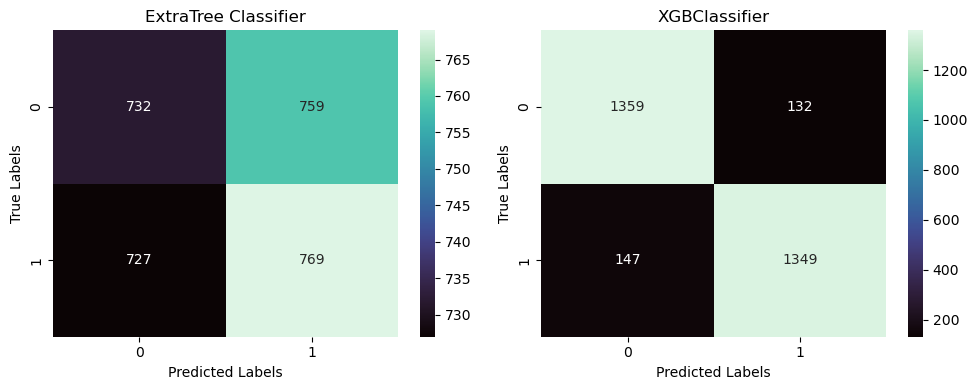

In [88]:
cm_et = confusion_matrix(Y_test, Y_pred_et)
cm_xgb = confusion_matrix(Y_test, Y_pred_xgb)

# Create subplots for the confusion matrices
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot ExtraTree Classifier Confusion Matrix
sns.heatmap(cm_et, annot=True, fmt="d", cmap="mako", ax=axes[0])
axes[0].set_title('ExtraTree Classifier')
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')

# Plot XGBClassifier Confusion Matrix
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="mako", ax=axes[1])
axes[1].set_title('XGBClassifier')
axes[1].set_xlabel('Predicted Labels')
axes[1].set_ylabel('True Labels')

plt.tight_layout()
plt.show()


In [89]:
# Calculate ROC AUC Score for ExtraTree Classifier
y_prob_ET = best_et.predict_proba(X_test)[:, 1]
auc_score_ET = roc_auc_score(Y_test, y_prob_ET)
print("ROC AUC Score Of ExtraTree Classifier:", auc_score_ET)

# Calculate ROC AUC Score for XGBClassifier
y_prob_XGB = best_xgb.predict_proba(X_test)[:, 1]
auc_score_XGB = roc_auc_score(Y_test, y_prob_XGB)
print("ROC AUC Score Of XGBClassifier:", auc_score_XGB)

ROC AUC Score Of ExtraTree Classifier: 0.9977940279825118
ROC AUC Score Of XGBClassifier: 0.9672495758866927


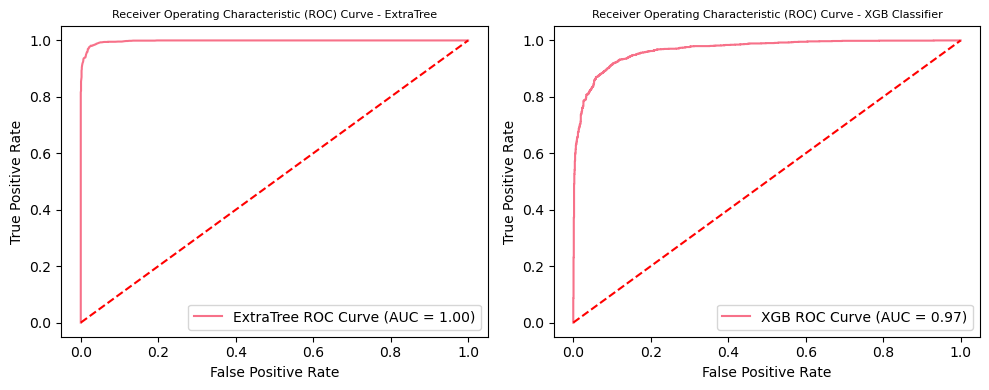

In [90]:
# Calculate ROC curves for both classifiers
fpr_ET, tpr_ET, _ = roc_curve(Y_test, y_prob_ET)
fpr_xgb, tpr_xgb, _ = roc_curve(Y_test, y_prob_XGB)

# Create subplots
plt.figure(figsize=(10, 4))

# Plot ROC curve for ExtraTree Classifier
plt.subplot(1, 2, 1)
plt.plot(fpr_ET, tpr_ET, label='ExtraTree ROC Curve (AUC = {:.2f})'.format(auc_score_ET))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - ExtraTree', fontsize=8)
plt.legend(loc='lower right')

# Plot ROC curve for Support Vector Classifier
plt.subplot(1, 2, 2)
plt.plot(fpr_xgb, tpr_xgb, label='XGB ROC Curve (AUC = {:.2f})'.format(auc_score_XGB))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - XGB Classifier',fontsize=8)
plt.legend(loc='lower right')

# Adjust layout and show plots
plt.tight_layout()
plt.show()

For Second Target

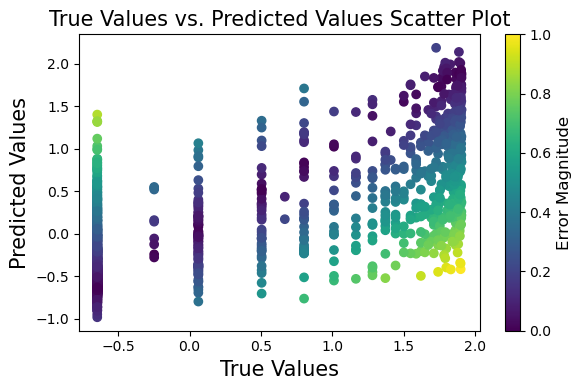

In [91]:
plt.figure(figsize=(6, 4))
y_pred_GBR = best_GBR.predict(test_x)

# Calculate absolute errors
errors = np.abs(test_y - y_pred_GBR)

# Create a color map based on the errors
colors = plt.cm.viridis(errors / max(errors))  # You can choose a different colormap if preferred

plt.scatter(test_y, y_pred_GBR, c=colors)
plt.title('True Values vs. Predicted Values Scatter Plot', fontsize=15)
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predicted Values', fontsize=15)

# Add colorbar to show the error magnitude
cbar = plt.colorbar()
cbar.set_label('Error Magnitude', fontsize=12)

plt.tight_layout()
plt.show()

In [92]:
# Saving first Model
filename = 'rainfalltomorrow_model.joblib'
joblib.dump(best_et,filename)

['rainfalltomorrow_model.joblib']

In [93]:
# saving Second Model
filename = 'rainfallamount_model.joblib'
joblib.dump(best_GBR,filename)

['rainfallamount_model.joblib']